### BACKGROUND: 


*The Office of Policy and Management maintains a listing of all real estate sales with a sales price of $2,000 or greater between October 1 and September 30 of each year. For each sale record, the file includes town, property address, date of sale, property type (residential, apartment, commercial, industrial, or vacant land), sales price, and property assessment*



### PROBLEM STATEMENT:

- Exploring Property Assessment and Sales data for Informed Decision-Making.




### DATASET DESCRIPTION 

*This dataset includes information such as the assessed value, sale amount, sales ratio, property type, and more, offering a rich source of insights into the real estate landscape.*


#### DATASET COLUMN DESCRIPTION 

-  Serial Number: Integer, A unique identifier assigned to each record in the dataset.

-  List Year: Integer or Date, the year in which the property information was listed or assessed.

-  Date Recorded: Date, the date when the property information was recorded or updated.

-  Town: String, the name of the town or locality where the property is located.

-  Address: String, the specific address or location details of the property.

-  Assessed Value: Integer, the assessed monetary value of the property, typically determined by a local assessor for taxation purposes.

-  Sale Amount: Integer, the amount for which the property was sold, if applicable.

-  Sales Ratio: float, the ratio of the sale amount to the assessed value, indicating the property's market value.

-  Property Type: Categorical, the general category or classification of the property (e.g., residential, commercial, industrial).

-  Residential Type: Categorical, further classification specifying the residential type (e.g., single-family, multi-family) if applicable.

-  Non-Use Code: Categorical, a code indicating the non-use status of the property, which might include information about exemptions or special classifications.

-  Assessor Remarks, String, additional remarks, or comments provided by the assessor related to the property assessment.

-  OPM Remarks: String, remarks or comments from the Office of Policy and Management (OPM) related to the property data, providing additional context or information.

### PROJECT OBJECTIVES


1. *Assessment Accuracy: Evaluate the accuracy of property assessments by comparing assessed values with actual sale amounts, and identify any discrepancies*

2. *Market Trends: Analyze sales ratios to uncover trends in property market values, understanding how sale amounts relate to the assessed values across different property types and residential classifications.*

3. *Geographical Analysis: Investigate variations in assessed values, sales amounts, and market ratios across different towns, providing a localized understanding of real estate dynamics*

4. *Property Type Impact: Examine the impact of property type on assessment accuracy and market trends, exploring whether certain types (e.g. residential, commercial) exhibit distinct patterns*

5. *Non-Use Code Insights Explore the significance of non-use codes in property assessment investigating how these codes influence assessed values and sales transactions.*

6. *Assessor and OPM Remarks: Analyze remarks provided by assessors and the Office of Polices and Management (OPM) to identify factors influencing  assessment decisions and potential improvement areas.

### IMPORTING NECCSSARY LIBRARIES

In [1]:
import pandas as pd
import numpy as np


# for visuals
import seaborn as sns
import matplotlib.pyplot as plt
plt.style.use('ggplot')
%matplotlib inline

In [2]:
#read and import file
data = pd.read_csv("Real_Estate_Sales_2001-2020_GL.csv")

#viwieng the data
data

C:\Users\HP\AppData\Local\Temp\ipykernel_13876\338034323.py:2: DtypeWarning: Columns (8,9,10,11,12) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("Real_Estate_Sales_2001-2020_GL.csv")


,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
0,2020348,2020,09/13/2021,Ansonia,230 WAKELEE AVE,150500.0,325000.0,0.463000,Commercial,NaN,NaN,NaN,NaN,NaN
1,20002,2020,10/02/2020,Ashford,390 TURNPIKE RD,253000.0,430000.0,0.588300,Residential,Single Family,NaN,NaN,NaN,NaN
2,200212,2020,03/09/2021,Avon,5 CHESTNUT DRIVE,130400.0,179900.0,0.724800,Residential,Condo,NaN,NaN,NaN,NaN
3,200243,2020,04/13/2021,Avon,111 NORTHINGTON DRIVE,619290.0,890000.0,0.695800,Residential,Single Family,NaN,NaN,NaN,NaN
4,200377,2020,07/02/2021,Avon,70 FAR HILLS DRIVE,862330.0,1447500.0,0.595700,Residential,Single Family,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997208,190272,2019,06/24/2020,New London,4 BISHOP CT,60410.0,53100.0,1.137665,Single Family,Single Family,14 - Foreclosure,NaN,NaN,NaN
997209,190284,2019,11/27/2019,Waterbury,126 PERKINS AVE,68280.0,76000.0,0.898400,Single Family,Single Family,25 - Other,PRIVATE SALE,NaN,NaN
997210,190129,2019,04/27/2020,Windsor Locks,19 HATHAWAY ST,121450.0,210000.0,0.578300,Single Family,Single Family,NaN,NaN,NaN,NaN
997211,190504,2019,06/03/2020,Middletown,8 BYSTREK DR,203360.0,280000.0,0.726300,Single Family,Single Family,NaN,NaN,NaN,NaN


In [3]:
#making a copy of the dataset
data_1 = data.copy()
data_1

,Serial Number,List Year,Date Recorded,Town,Address,Assessed Value,Sale Amount,Sales Ratio,Property Type,Residential Type,Non Use Code,Assessor Remarks,OPM remarks,Location
0,2020348,2020,09/13/2021,Ansonia,230 WAKELEE AVE,150500.0,325000.0,0.463000,Commercial,NaN,NaN,NaN,NaN,NaN
1,20002,2020,10/02/2020,Ashford,390 TURNPIKE RD,253000.0,430000.0,0.588300,Residential,Single Family,NaN,NaN,NaN,NaN
2,200212,2020,03/09/2021,Avon,5 CHESTNUT DRIVE,130400.0,179900.0,0.724800,Residential,Condo,NaN,NaN,NaN,NaN
3,200243,2020,04/13/2021,Avon,111 NORTHINGTON DRIVE,619290.0,890000.0,0.695800,Residential,Single Family,NaN,NaN,NaN,NaN
4,200377,2020,07/02/2021,Avon,70 FAR HILLS DRIVE,862330.0,1447500.0,0.595700,Residential,Single Family,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997208,190272,2019,06/24/2020,New London,4 BISHOP CT,60410.0,53100.0,1.137665,Single Family,Single Family,14 - Foreclosure,NaN,NaN,NaN
997209,190284,2019,11/27/2019,Waterbury,126 PERKINS AVE,68280.0,76000.0,0.898400,Single Family,Single Family,25 - Other,PRIVATE SALE,NaN,NaN
997210,190129,2019,04/27/2020,Windsor Locks,19 HATHAWAY ST,121450.0,210000.0,0.578300,Single Family,Single Family,NaN,NaN,NaN,NaN
997211,190504,2019,06/03/2020,Middletown,8 BYSTREK DR,203360.0,280000.0,0.726300,Single Family,Single Family,NaN,NaN,NaN,NaN


### DATA INSPECTION 

In [4]:
#shape of the data
data_1.shape

(997213, 14)

#### *We have 997,213 rows and 14 columns in the dataset.* 

In [5]:
#display information of the dataset
data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 997213 entries, 0 to 997212
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Serial Number     997213 non-null  int64  
 1   List Year         997213 non-null  int64  
 2   Date Recorded     997211 non-null  object 
 3   Town              997213 non-null  object 
 4   Address           997162 non-null  object 
 5   Assessed Value    997213 non-null  float64
 6   Sale Amount       997213 non-null  float64
 7   Sales Ratio       997213 non-null  float64
 8   Property Type     614767 non-null  object 
 9   Residential Type  608904 non-null  object 
 10  Non Use Code      289681 non-null  object 
 11  Assessor Remarks  149864 non-null  object 
 12  OPM remarks       9934 non-null    object 
 13  Location          197697 non-null  object 
dtypes: float64(3), int64(2), object(9)
memory usage: 106.5+ MB


#### *We have 5 numerical (integer and float) columns data type and 9 non-numeircal column data type.* 

In [6]:
#display the summary statistics of the numerical columns
data_1.describe().astype('int', 'float')

,Serial Number,List Year,Assessed Value,Sale Amount,Sales Ratio
count,997213,997213,997213,997213,997213
mean,431186,2010,279143,391151,10
std,6549219,6,1670609,5347270,1890
min,0,2001,0,0,0
25%,30444,2004,87600,140000,0
50%,70303,2010,138390,225000,0
75%,151878,2016,225560,365000,0
max,2000500023,2020,881510000,-2147483648,1226420


In [7]:
#check the data types of each columns
data_1.dtypes

Serial Number         int64
List Year             int64
Date Recorded        object
Town                 object
Address              object
Assessed Value      float64
Sale Amount         float64
Sales Ratio         float64
Property Type        object
Residential Type     object
Non Use Code         object
Assessor Remarks     object
OPM remarks          object
Location             object
dtype: object

In [8]:
# columns of the data
data_1.columns.tolist()

['Serial Number',
 'List Year',
 'Date Recorded',
 'Town',
 'Address',
 'Assessed Value',
 'Sale Amount',
 'Sales Ratio',
 'Property Type',
 'Residential Type',
 'Non Use Code',
 'Assessor Remarks',
 'OPM remarks',
 'Location']

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

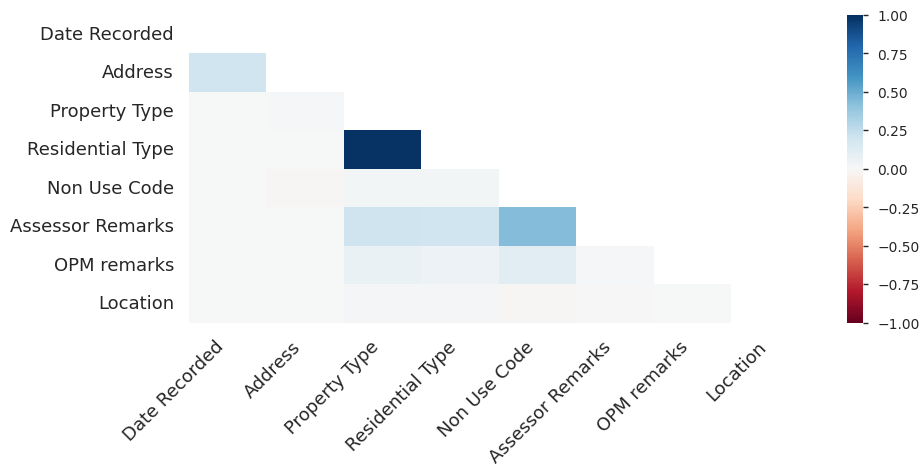

In [9]:
#viewing porfile report
#Create a pandas profiling reports to gain insights into the dataset
from ydata_profiling import ProfileReport

Data_profile = ProfileReport(data_1, title = 'Data_Report')

Data_profile.to_notebook_iframe()

- From our repot, there are no duplicate rows
- There are missing cells in our data,
- The columns are of different data type
- The corelation between the Assessed values and sales amount is high with value of 0.757
- Also, corelation between the Resisdential and Property Type is high with value of 0.945

In [10]:
#Check for missing values
data_1.isnull().sum()

Serial Number            0
List Year                0
Date Recorded            2
Town                     0
Address                 51
Assessed Value           0
Sale Amount              0
Sales Ratio              0
Property Type       382446
Residential Type    388309
Non Use Code        707532
Assessor Remarks    847349
OPM remarks         987279
Location            799516
dtype: int64

***We have 8 columns with missing values which we will have to fill/handle***

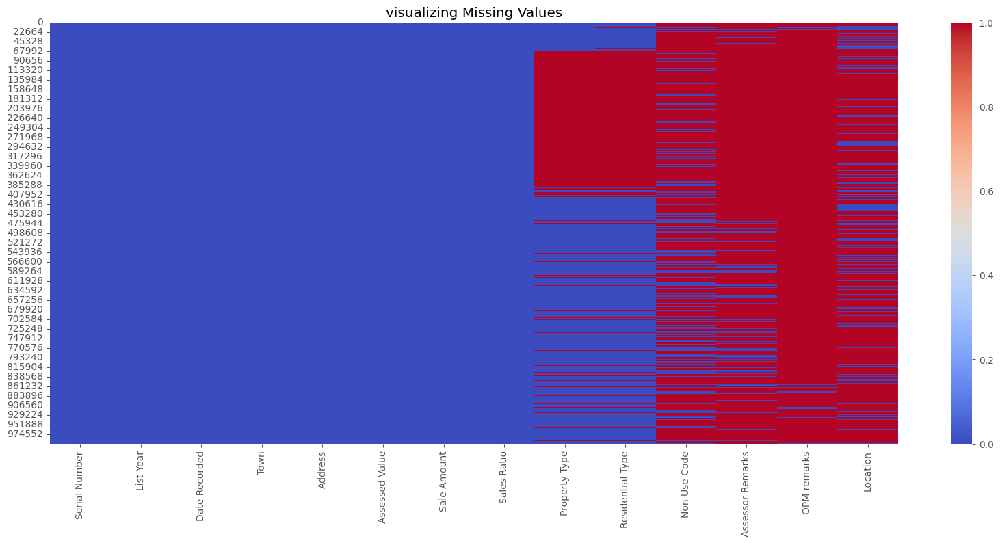

In [11]:
# Visualize the missing values
plt.figure(figsize = (20, 8))
plt.title('visualizing Missing Values')
sns.heatmap(data_1.isnull(), cbar = True, cmap = 'coolwarm')
plt.show()

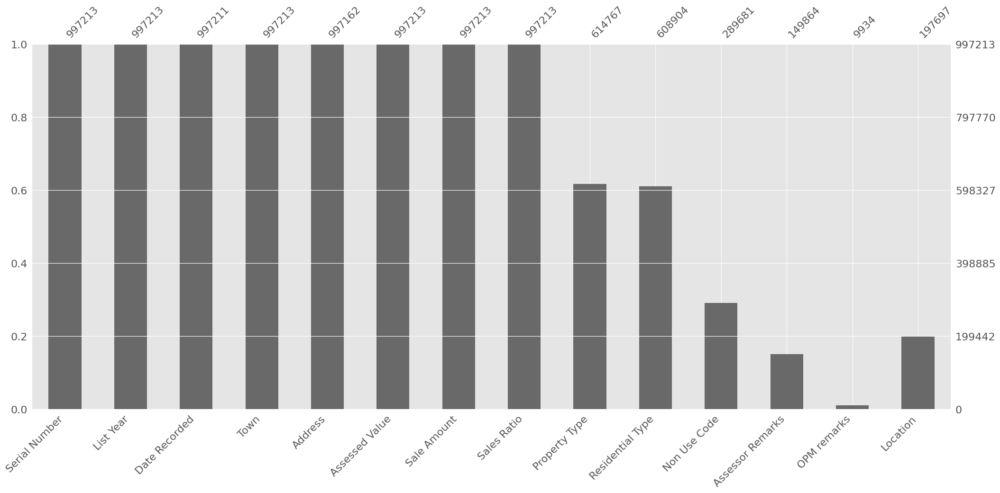

In [12]:
# Show the pattern of missingness to see how many missing cells are present
import missingno as msno
msno.bar(data_1)
plt.show()

In [13]:
#check for duplicates
data_1.duplicated().sum()

0

## DATA PREPROCESSING AND DATA CLEANING

In [14]:
# select numerical variables
numerical_variables = data_1.select_dtypes(include = ['float', 'int64']).columns.tolist()
print(numerical_variables)

# value counts for numerical variables
for column in numerical_variables:
    print(data_1[column].value_counts())

['Serial Number', 'List Year', 'Assessed Value', 'Sale Amount', 'Sales Ratio']
Serial Number
10010      172
10018      172
10002      172
10003      171
10009      171
          ... 
124743       1
124571       1
125068       1
124724       1
1910419      1
Name: count, Length: 83537, dtype: int64
List Year
2004    84056
2020    66592
2003    64239
2005    61602
2002    59682
2001    59584
2019    58954
2018    50709
2016    49773
2014    49563
2006    48785
2015    46651
2017    45691
2009    42508
2013    39943
2012    35973
2007    35617
2010    33491
2008    32735
2011    31065
Name: count, dtype: int64
Assessed Value
0.0          6933
17500.0       603
105000.0      553
35000.0       536
70000.0       473
             ... 
1802750.0       1
1192500.0       1
20886.0         1
54041.0         1
4035970.0       1
Name: count, Length: 91378, dtype: int64
Sale Amount
150000.0     9401
200000.0     8999
250000.0     8471
175000.0     7547
225000.0     7421
             ... 
746167.0   

In [15]:
# select categorical variables
categorical_variables = data_1.select_dtypes(include = ['object']).columns.tolist()
print(categorical_variables)

# value counts for categorical variables
for column in categorical_variables:
    print(data_1[column].value_counts())

['Date Recorded', 'Town', 'Address', 'Property Type', 'Residential Type', 'Non Use Code', 'Assessor Remarks', 'OPM remarks', 'Location']
Date Recorded
07/01/2005    877
08/01/2005    859
07/01/2004    840
06/30/2005    828
09/30/2005    781
             ... 
01/21/2006      1
07/07/2012      1
04/14/2012      1
07/28/2012      1
03/07/2020      1
Name: count, Length: 6387, dtype: int64
Town
Bridgeport       34201
Stamford         32529
Waterbury        28506
Norwalk          23960
New Haven        21346
                 ...  
Hartland           448
Scotland           430
Canaan             429
Union              261
***Unknown***        1
Name: count, Length: 170, dtype: int64
Address
MULTI ADDRESSES            620
8 SOUTH RD                 420
51 OLD SPRINGFIELD RD      172
312 N BISHOP AVE           114
RIGGS ST                   106
                          ... 
655 120 TALCOTTVILLE RD      1
414 SALMON BRK ST            1
21 BUTTERNUT KNL             1
59 BURNSIDE AVE UT 2 &     

In [16]:
 #replacing column space with underscore
new_columns = []
for column in data_1.columns:
    if " " in column:
        fill = column.replace(" ","_")
        new_columns.append(fill)
    else:
        new_columns.append(column)

In [17]:
#calling the function to replace the newly titled data
data_1.columns = new_columns

#viewing the data to see changes
data_1.head()

,Serial_Number,List_Year,Date_Recorded,Town,Address,Assessed_Value,Sale_Amount,Sales_Ratio,Property_Type,Residential_Type,Non_Use_Code,Assessor_Remarks,OPM_remarks,Location
0,2020348,2020,09/13/2021,Ansonia,230 WAKELEE AVE,150500.0,325000.0,0.4630,Commercial,NaN,NaN,NaN,NaN,NaN
1,20002,2020,10/02/2020,Ashford,390 TURNPIKE RD,253000.0,430000.0,0.5883,Residential,Single Family,NaN,NaN,NaN,NaN
2,200212,2020,03/09/2021,Avon,5 CHESTNUT DRIVE,130400.0,179900.0,0.7248,Residential,Condo,NaN,NaN,NaN,NaN
3,200243,2020,04/13/2021,Avon,111 NORTHINGTON DRIVE,619290.0,890000.0,0.6958,Residential,Single Family,NaN,NaN,NaN,NaN
4,200377,2020,07/02/2021,Avon,70 FAR HILLS DRIVE,862330.0,1447500.0,0.5957,Residential,Single Family,NaN,NaN,NaN,NaN


In [18]:
data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 997213 entries, 0 to 997212
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Serial_Number     997213 non-null  int64  
 1   List_Year         997213 non-null  int64  
 2   Date_Recorded     997211 non-null  object 
 3   Town              997213 non-null  object 
 4   Address           997162 non-null  object 
 5   Assessed_Value    997213 non-null  float64
 6   Sale_Amount       997213 non-null  float64
 7   Sales_Ratio       997213 non-null  float64
 8   Property_Type     614767 non-null  object 
 9   Residential_Type  608904 non-null  object 
 10  Non_Use_Code      289681 non-null  object 
 11  Assessor_Remarks  149864 non-null  object 
 12  OPM_remarks       9934 non-null    object 
 13  Location          197697 non-null  object 
dtypes: float64(3), int64(2), object(9)
memory usage: 106.5+ MB


### HANDLING MISSING VALUES

In [19]:
from sklearn.impute import SimpleImputer
data_1.isnull().sum()


Serial_Number            0
List_Year                0
Date_Recorded            2
Town                     0
Address                 51
Assessed_Value           0
Sale_Amount              0
Sales_Ratio              0
Property_Type       382446
Residential_Type    388309
Non_Use_Code        707532
Assessor_Remarks    847349
OPM_remarks         987279
Location            799516
dtype: int64

In [20]:
def handle_missing_values_with_imputer(data_1):
    # Create a SimpleImputer object to replace missing values with the most frequent value (mode)
    imputer = SimpleImputer(strategy='most_frequent')
    
    # Fill missing values in object datatype columns with the most frequent value
    data_object_cols = data_1.select_dtypes(include=['object']).columns
    data_1[data_object_cols] = imputer.fit_transform(data_1[data_object_cols])
    
    return data_1

In [21]:
data_1 = handle_missing_values_with_imputer(data_1)

#to check if our missing values have been handled
data_1.isnull().sum()

Serial_Number       0
List_Year           0
Date_Recorded       0
Town                0
Address             0
Assessed_Value      0
Sale_Amount         0
Sales_Ratio         0
Property_Type       0
Residential_Type    0
Non_Use_Code        0
Assessor_Remarks    0
OPM_remarks         0
Location            0
dtype: int64

***From our result, all the missing values have been filled by defining a function using Simple Imputer to handle missing values.***

In [22]:
#changing the datatype of Time column
data_1["Date_Recorded"] = pd.to_datetime(data_1["Date_Recorded"])

#view the data type of the columns to confirm if it has been changed
data_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 997213 entries, 0 to 997212
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Serial_Number     997213 non-null  int64         
 1   List_Year         997213 non-null  int64         
 2   Date_Recorded     997213 non-null  datetime64[ns]
 3   Town              997213 non-null  object        
 4   Address           997213 non-null  object        
 5   Assessed_Value    997213 non-null  float64       
 6   Sale_Amount       997213 non-null  float64       
 7   Sales_Ratio       997213 non-null  float64       
 8   Property_Type     997213 non-null  object        
 9   Residential_Type  997213 non-null  object        
 10  Non_Use_Code      997213 non-null  object        
 11  Assessor_Remarks  997213 non-null  object        
 12  OPM_remarks       997213 non-null  object        
 13  Location          997213 non-null  object        
dtypes: d

***The data type of the Data_recorded has been changed to Date-Time datatype***

In [23]:
#Check the unique values in each column
def check_unique_values(data_1):
    unique_values = data_1.apply(pd.Series.nunique)  # Get unique values for each column
    
    return unique_values

In [24]:
#calling our function
unique_values = check_unique_values(data_1)
print("Unique values for each column:")
print(unique_values)

Unique values for each column:
Serial_Number        83537
List_Year               20
Date_Recorded         6387
Town                   170
Address             714371
Assessed_Value       91378
Sale_Amount          57372
Sales_Ratio         547044
Property_Type           11
Residential_Type         5
Non_Use_Code           106
Assessor_Remarks     66508
OPM_remarks           4825
Location            130529
dtype: int64


In [25]:
data_1.head(100)

,Serial_Number,List_Year,Date_Recorded,Town,Address,Assessed_Value,Sale_Amount,Sales_Ratio,Property_Type,Residential_Type,Non_Use_Code,Assessor_Remarks,OPM_remarks,Location
0,2020348,2020,2021-09-13,Ansonia,230 WAKELEE AVE,150500.0,325000.0,0.463000,Commercial,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
1,20002,2020,2020-10-02,Ashford,390 TURNPIKE RD,253000.0,430000.0,0.588300,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
2,200212,2020,2021-03-09,Avon,5 CHESTNUT DRIVE,130400.0,179900.0,0.724800,Residential,Condo,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
3,200243,2020,2021-04-13,Avon,111 NORTHINGTON DRIVE,619290.0,890000.0,0.695800,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
4,200377,2020,2021-07-02,Avon,70 FAR HILLS DRIVE,862330.0,1447500.0,0.595700,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,201078,2020,2020-12-21,Griswold,22 CROSS RD,173040.0,302000.0,0.572900,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
96,12532,2001,2002-08-13,Bolton,45 BEACON CT,0.0,12350.0,0.000000,Single Family,Single Family,8,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
97,200436,2020,2021-05-04,Groton,67 LEAFWOOD LN S250,71960.0,130000.0,0.553500,Residential,Condo,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
98,200639,2020,2021-07-28,Groton,4 TYLER AVE,259770.0,650000.0,0.399646,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.07229 41.32148)


### HANDLING OUTLIERS


### INTERQUARTILE RANGE (IQR) METHOD

*Calling on the dataset to handle outliers using the `Interquartile Range Method (IQR)` to see if there will be changes in our data when handling the outliers*

Numercial Columns with outliers:
Serial_Number
Assessed_Value
Sale_Amount
Sales_Ratio


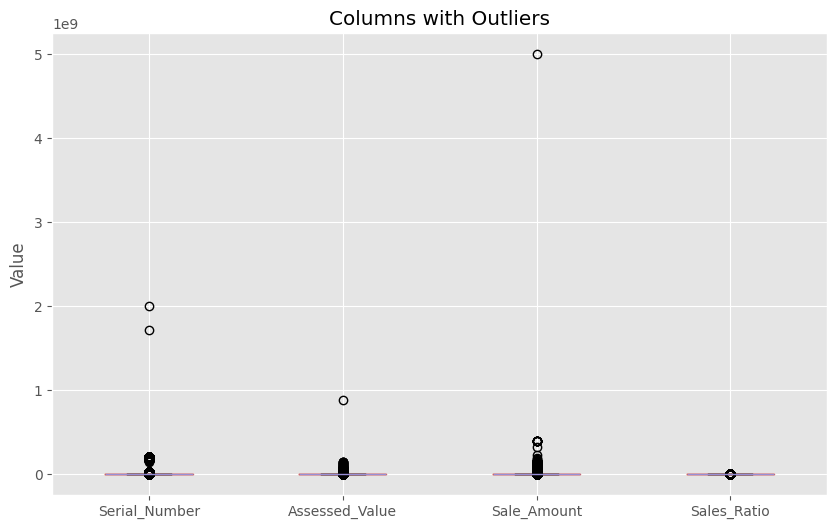

In [26]:
#Viewing the columns with outliers
#defining the first quartile "Q1" and third quartile "Q3"
numerical_cols = data_1.select_dtypes(include=['float', 'int']).columns
Q1 = data_1[numerical_cols].quantile(0.25)
Q3 = data_1[numerical_cols].quantile(0.75)
IQR = Q3 - Q1

# Find columns with outliers on our original data
outliers = ((data_1[numerical_cols] < (Q1 - 1.5 * IQR)) | (data_1[numerical_cols] > (Q3 + 1.5 * IQR))).any()

# Plot box plots for columns with outliers
outlier_cols = outliers[outliers].index

# Print the names of columns with outliers
print("Numercial Columns with outliers:")
for col in outlier_cols:
    print(col)

#plotting columns with outliers
plt.figure(figsize=(10, 6))
data_1[outlier_cols].boxplot()
plt.title('Columns with Outliers')
plt.ylabel('Value')

plt.show()

***We have four numerical columns with outliers and they are Serial_number, Assessed_Value, Sale_Amount and Sales Ratio.***

In [27]:
## Function to handle outliers using the Interquartile Range (IQR) method
def handle_outliers(data_1, columns):
    for column in columns:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = data_1[column].quantile(0.25)
        Q3 = data_1[column].quantile(0.75)
        
        # Calculate interquartile range (IQR)
        IQR = Q3 - Q1

        # Define the lower and upper bounds for outlier detection
        lower_bound = Q1 - 1.5 * IQR #where k = 1.5
        upper_bound = Q3 + 1.5 * IQR
    
        # Identify outliers
        outliers = (data_1[column] < lower_bound) | (data_1[column] > upper_bound)
    
        # Replace outliers with lower or upper bound
       # Cap the outliers at the defined bounds
        data_1[column]= data_1[column].clip(lower=lower_bound, upper=upper_bound)
    
    return data_1

In [28]:
columns_to_handle_outliers = data_1.select_dtypes(include=['float', 'int']).columns

# Handle outliers in the specified columns and assign them to a new variable called "data_cleaned"
Data_cleaned = handle_outliers(data_1, columns_to_handle_outliers)

# Display the cleaned DataFrame 
Data_cleaned

,Serial_Number,List_Year,Date_Recorded,Town,Address,Assessed_Value,Sale_Amount,Sales_Ratio,Property_Type,Residential_Type,Non_Use_Code,Assessor_Remarks,OPM_remarks,Location
0,334029,2020,2021-09-13,Ansonia,230 WAKELEE AVE,150500.0,325000.0,0.463000,Commercial,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
1,20002,2020,2020-10-02,Ashford,390 TURNPIKE RD,253000.0,430000.0,0.588300,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
2,200212,2020,2021-03-09,Avon,5 CHESTNUT DRIVE,130400.0,179900.0,0.724800,Residential,Condo,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
3,200243,2020,2021-04-13,Avon,111 NORTHINGTON DRIVE,432500.0,702500.0,0.695800,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
4,200377,2020,2021-07-02,Avon,70 FAR HILLS DRIVE,432500.0,702500.0,0.595700,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997208,190272,2019,2020-06-24,New London,4 BISHOP CT,60410.0,53100.0,1.137665,Single Family,Single Family,14 - Foreclosure,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
997209,190284,2019,2019-11-27,Waterbury,126 PERKINS AVE,68280.0,76000.0,0.898400,Single Family,Single Family,25 - Other,PRIVATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
997210,190129,2019,2020-04-27,Windsor Locks,19 HATHAWAY ST,121450.0,210000.0,0.578300,Single Family,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)
997211,190504,2019,2020-06-03,Middletown,8 BYSTREK DR,203360.0,280000.0,0.726300,Single Family,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461)


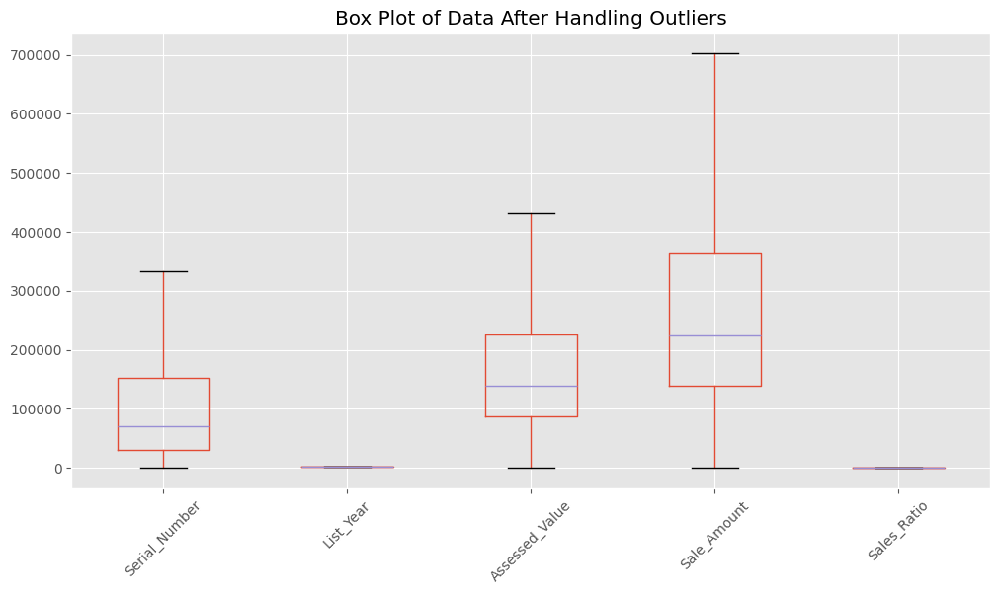

In [29]:
# Plot box plots for all columns to visualize the data distribution after handling outliers
plt.figure(figsize=(12, 6))
Data_cleaned.boxplot()
plt.title('Box Plot of Data After Handling Outliers')
plt.xticks(rotation=45)
plt.show()

- From our visulization, the outliers present in the numerical columns have been handled and the shape of the dataset is still maintained. 

In [30]:
#checking the consistency of each column data type. 

def check_data_type_consistency_single_column(Data_cleaned, column_name, expected_data_type):
    # Check if the data type of values in the specified column matches the expected data type
    is_consistent = Data_cleaned[column_name].apply(lambda x: isinstance(x, expected_data_type)).all()
    
    return is_consistent

In [31]:
column_name = 'Non_Use_Code'

# Specify the expected data type.
expected_data_type = str
is_consistent = check_data_type_consistency_single_column(Data_cleaned, column_name, expected_data_type)
print(f"Data type consistency in column '{column_name}': {is_consistent}")

Data type consistency in column 'Non_Use_Code': False


***From the dataset, the Non_Use_Code column has a different data type making it inconsistent. The expected data type should be a string but it does not see the column data type as a string so we have to change the data type to the expected datatype ("str/object").***

In [32]:
#changing the data type to a string
Data_cleaned['Non_Use_Code'] = Data_cleaned['Non_Use_Code'].astype(str)

Data_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 997213 entries, 0 to 997212
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Serial_Number     997213 non-null  int64         
 1   List_Year         997213 non-null  int64         
 2   Date_Recorded     997213 non-null  datetime64[ns]
 3   Town              997213 non-null  object        
 4   Address           997213 non-null  object        
 5   Assessed_Value    997213 non-null  float64       
 6   Sale_Amount       997213 non-null  float64       
 7   Sales_Ratio       997213 non-null  float64       
 8   Property_Type     997213 non-null  object        
 9   Residential_Type  997213 non-null  object        
 10  Non_Use_Code      997213 non-null  object        
 11  Assessor_Remarks  997213 non-null  object        
 12  OPM_remarks       997213 non-null  object        
 13  Location          997213 non-null  object        
dtypes: d

In [33]:
def check_data_type_consistency_single_column(Data_cleaned, column_name, expected_data_type):
    # Check if the data type of values in the specified column matches the expected data type
    is_consistent = Data_cleaned[column_name].apply(lambda x: isinstance(x, expected_data_type)).all()
    
    return is_consistent

In [34]:
column_name = 'Non_Use_Code'

# Specify the expected data type.
expected_data_type = str
is_consistent = check_data_type_consistency_single_column(Data_cleaned, column_name, expected_data_type)
print(f"Data type consistency in column '{column_name}': {is_consistent}")

Data type consistency in column 'Non_Use_Code': True


***The data type has been changed so the column is consistent.***

In [35]:
#saving our cleaned dataset to a csv file
Real_Estate_Sales_data = Data_cleaned.to_csv("Cleaned_Real_Estate_Sales_Data.csv", index = False)

#here we have it saved in our directory with the name "Cleaned Real Estate Sales Data"

### **Now that we have pre-processed and cleaned the dataset, the cleaned data is saved in a CSV file and we can now proceed to our Exploratory Analysis**

## EXPLORATORY ANALYSIS

- Univariate Analysis
- Bivariate Analysis


In [36]:
Data_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 997213 entries, 0 to 997212
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype         
---  ------            --------------   -----         
 0   Serial_Number     997213 non-null  int64         
 1   List_Year         997213 non-null  int64         
 2   Date_Recorded     997213 non-null  datetime64[ns]
 3   Town              997213 non-null  object        
 4   Address           997213 non-null  object        
 5   Assessed_Value    997213 non-null  float64       
 6   Sale_Amount       997213 non-null  float64       
 7   Sales_Ratio       997213 non-null  float64       
 8   Property_Type     997213 non-null  object        
 9   Residential_Type  997213 non-null  object        
 10  Non_Use_Code      997213 non-null  object        
 11  Assessor_Remarks  997213 non-null  object        
 12  OPM_remarks       997213 non-null  object        
 13  Location          997213 non-null  object        
dtypes: d

In [37]:
Data_cleaned.describe()

,Serial_Number,List_Year,Date_Recorded,Assessed_Value,Sale_Amount,Sales_Ratio
count,997213.000000,997213.000000,997213,997213.000000,997213.000000,997213.000000
mean,97895.698854,2010.189829,2011-06-19 11:39:01.489330432,172333.746177,276196.106068,0.660875
min,0.000000,2001.000000,1999-04-05 00:00:00,0.000000,0.000000,0.038836
25%,30444.000000,2004.000000,2005-07-25 00:00:00,87600.000000,140000.000000,0.486700
50%,70303.000000,2010.000000,2011-01-19 00:00:00,138390.000000,225000.000000,0.624600
75%,151878.000000,2016.000000,2017-04-05 00:00:00,225560.000000,365000.000000,0.785276
max,334029.000000,2020.000000,2021-09-30 00:00:00,432500.000000,702500.000000,1.233140
std,81271.409776,6.237877,NaN,118252.845743,190539.409275,0.272840


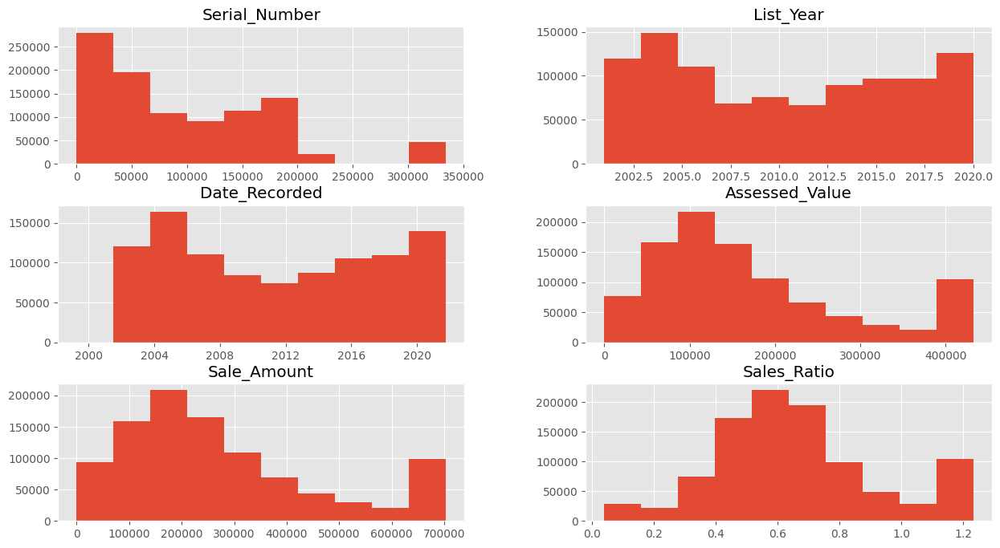

In [38]:
Data_cleaned.hist(figsize = (15,8));

**This plot shows the value distribution for all numerical columns. It plots a histogram chart showing distribtuion through each values in each column.** 

### ***UNIVARIATE ANALYSIS***

- Univariate analysis is a statistical method used to analyze data involving a single variable at a time.

In [39]:
#value count for Residential_Type
Data_cleaned["Residential_Type"].value_counts()


Residential_Type
Single Family    833325
Condo            117780
Two Family        29609
Three Family      14081
Four Family        2418
Name: count, dtype: int64

In [40]:
print(Data_cleaned["Residential_Type"].nunique())

5


Text(0.5, 1.0, 'Count Plot for Residential_Type')

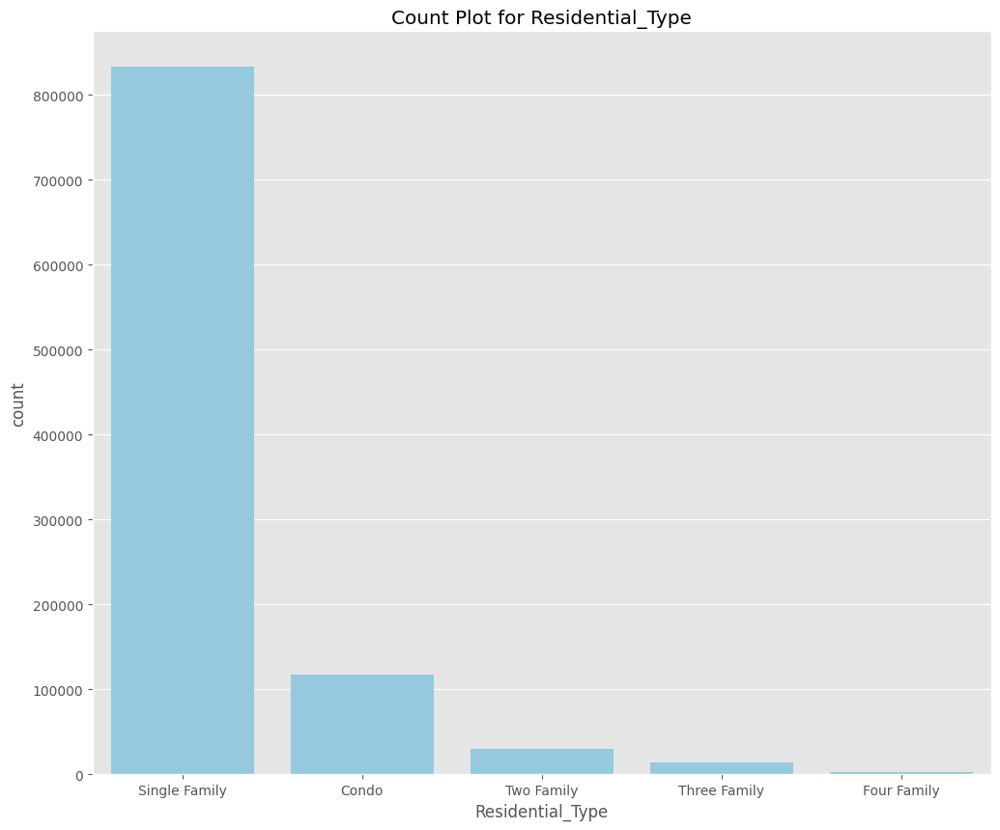

In [41]:
#count plot for Residential Type
plt.figure(figsize=(12, 10))
sns.countplot(data = Data_cleaned, x = "Residential_Type", color = 'skyblue');
plt.title("Count Plot for Residential_Type")

**Among the residential_properties in the dataset:**

- Single-family homes are the most prevalent, with a count of 833,325 making it the highest value count in the residential type.
- Condos are the next most common type, with 117,780 units.
- Two-family homes follow with a count of 29,609.
- Three Family residences are less common, with total of 14,081.
- Four-family properties have the lowest count at 2,418 units making it the lowest value count in the residential type.

***In conclusion, the `Single-Family` residential type is the most popular and the `Four-family` residential type is the least popular.*** 

In [42]:
#value count for Property_Type
Rest_dist = Data_cleaned["Property_Type"].value_counts()
Rest_dist

Property_Type
Single Family     784058
Condo             105420
Residential        60728
Two Family         26408
Three Family       12586
Vacant Land         3163
Four Family         2150
Commercial          1981
Apartments           486
Industrial           228
Public Utility         5
Name: count, dtype: int64

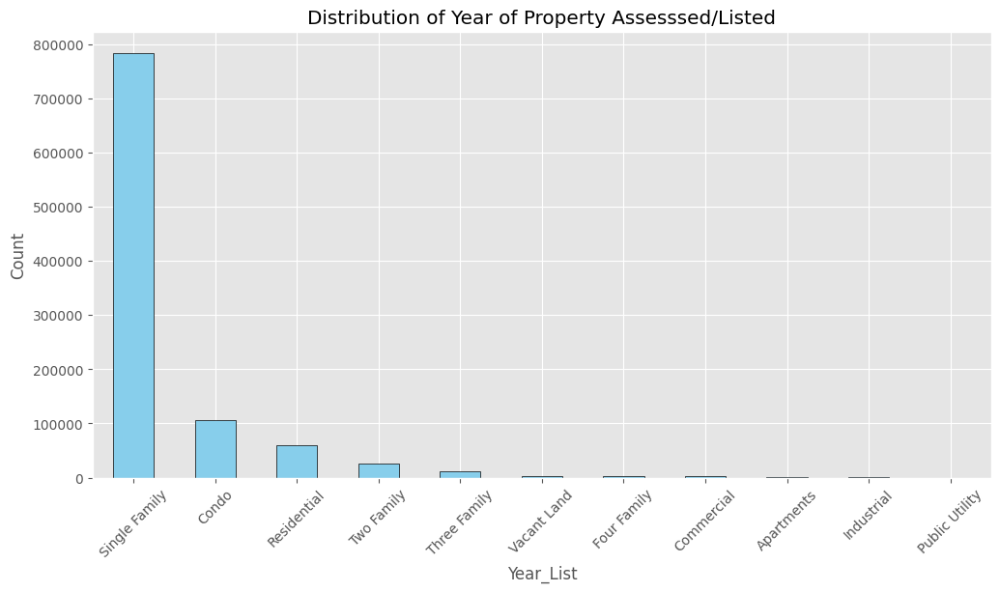

In [43]:
#bar plot for Property Type
Rest_dist.plot(kind='bar', color='skyblue', edgecolor = 'black',figsize = (12, 6))
plt.xticks(rotation=45)
plt.title('Distribution of Year of Property Assesssed/Listed')
plt.xlabel('Year_List')
plt.ylabel('Count')
plt.show()

**The distribution of property type in this dataset is as follows:**

- Single-family homes are the most common property type, with a count of 784,058, making it the most popular property type.
- Condos property type have a value of 105,420.
- Residential properties have a total of 60,728.
- Two-family homes amount to 26,408
- Three-family residences are represented by 12,586 units.
- Vacant Land has value of 3,163
- Four Family properties account for 2,150 units.
- Commercial properties are at 1,981.
- Apartments and Industrial properties have counts of 486 and 228 respectively.
- Public Utility properties are the least represented with only 5 units, making it the least popular. 

***In conclusion, the `Single-Family` property type is the most popular and the `Public Utility` property type is the least popular***

In [44]:
#value count for List_year(year that propert type was listed 0r assesed)
Year_dist = Data_cleaned["List_Year"].value_counts()

Year_dist

List_Year
2004    84056
2020    66592
2003    64239
2005    61602
2002    59682
2001    59584
2019    58954
2018    50709
2016    49773
2014    49563
2006    48785
2015    46651
2017    45691
2009    42508
2013    39943
2012    35973
2007    35617
2010    33491
2008    32735
2011    31065
Name: count, dtype: int64

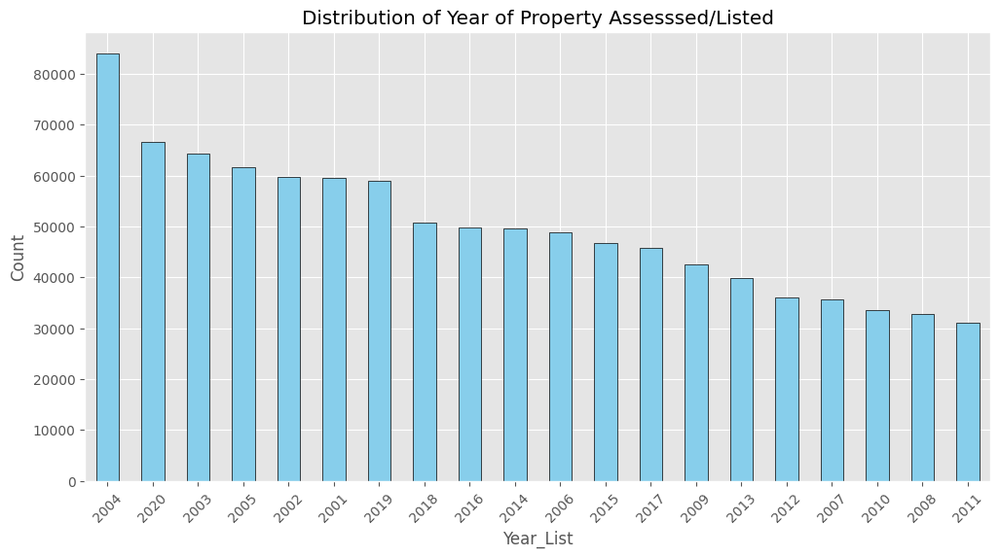

In [45]:
# Create a histogram for the "List_Year" column

Year_dist.plot(kind='bar', color='skyblue', edgecolor = 'black',figsize = (12, 6))
plt.xticks(rotation=45)
plt.title('Distribution of Year of Property Assesssed/Listed')
plt.xlabel('Year_List')
plt.ylabel('Count')
plt.show()

***The plot shows that 2004 has the highest count of property listed or assessed with value count of 84,056. On the other hand, the year 2011, have the lowest count of property listest or assessed with value count of 31,065.****

### ***BIVARIATE ANALYSIS***

- Bivariate analysis is a statistical method used to analyze the relationship between two variables simultaneously.

In [46]:
Data_cleaned.columns.tolist()

['Serial_Number',
 'List_Year',
 'Date_Recorded',
 'Town',
 'Address',
 'Assessed_Value',
 'Sale_Amount',
 'Sales_Ratio',
 'Property_Type',
 'Residential_Type',
 'Non_Use_Code',
 'Assessor_Remarks',
 'OPM_remarks',
 'Location']

## ***OBJECTIVE ONE***
 - `Assessment Accuracy`: Evaluate the accuracy of property assessments by comparing assessed 
values with actual sale amounts, and identify any discrepancies

#### ***Steps To achieve the above objective:***

- Explore the distribution of assessed values and sale amounts using descriptive statistics and visualizations.

- Calculate the discrepancies between assessed values and sale amounts for each property. This can be done by subtracting the assessed value from the sale amount.

- Plot the discrepancies to identify patterns or outliers in the data. Visualize the distribution of discrepancies using histograms and it can help  identify any systematic biases or trends in the assessment accuracy.

- Calculate accuracy metrics such as Mean Absolute Error (MAE), Mean Squared Error (MSE), or Root Mean Squared Error (RMSE) to quantify the overall accuracy of property assessments.

- Analyze the discrepancies between assessed values and actual sale amounts to identify potential reasons for inaccuracies.

- Conduct statistical tests to determine if the discrepancies are statistically significant.

#### ***Explore and Visualize Distribution***

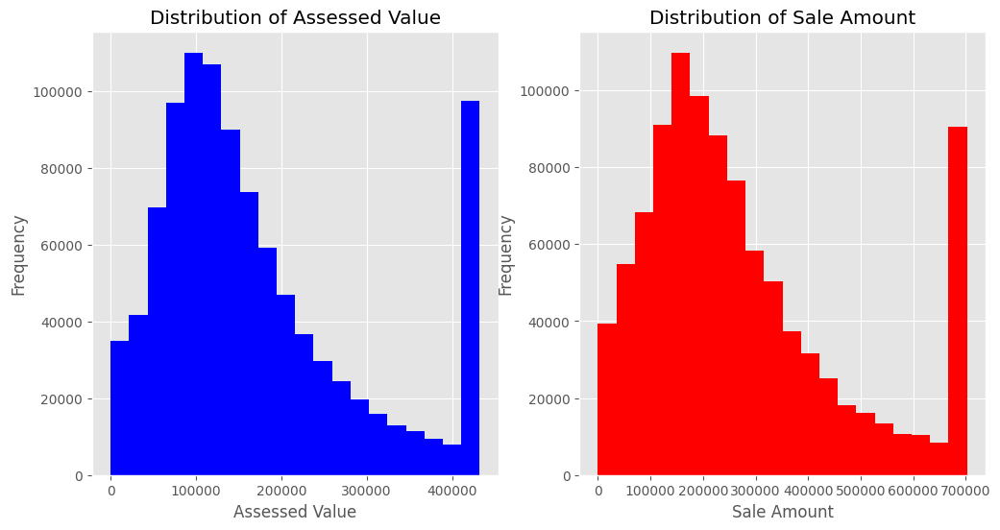

In [47]:
# Create a subplots for the distribution of Sales amount and Assessed Value
fig, axs = plt.subplots(1, 2, figsize = (12, 6))

# customie subplot 1 - Assessed Value
axs[0].hist(Data_cleaned['Assessed_Value'], bins = 20, color = 'blue', label = 'Assessed_Value')
axs[0].set_title('Distribution of Assessed Value')
axs[0].set_xlabel('Assessed Value')
axs[0].set_ylabel('Frequency')

# customize subplot 2 - Sales Amount
axs[1].hist(Data_cleaned['Sale_Amount'], bins = 20, color = 'red', label = 'Sale_Amount')
axs[1].set_title('Distribution of Sale Amount')
axs[1].set_xlabel('Sale Amount')
axs[1].set_ylabel('Frequency')

# display the plot
plt.show()

- The plot shows that most property sale amounts are between 100,000 and 200,000 with a peak of 200,000 and the sales amount keeps decreasing as the sales amount increases. For Assessed Value, most property assessed values are between 10,000 to 20,000 as well. 

- For both plot, there is a notable drop in frequency as the amount/value increases(exceeds 200,000)

#### ***Calculate Discrepancies***

- Discrepancies mean differences or deviations between the assessed values of properties and their corresponding actual sale amounts. These differences can arise due to various factors such as inaccuracies in the assessment process, market flunctuations and so on.

- Analyzing discrepancies is important because it helps evaluate the accuracy of property assessments and identify potential issues or inconsistencies in the valuation process.


In [48]:
#calculate discrepancies
Data_cleaned['Discrepancy'] = Data_cleaned['Sale_Amount'] - Data_cleaned['Assessed_Value']

Data_cleaned.head()

#Discrepancy column have been created

,Serial_Number,List_Year,Date_Recorded,Town,Address,Assessed_Value,Sale_Amount,Sales_Ratio,Property_Type,Residential_Type,Non_Use_Code,Assessor_Remarks,OPM_remarks,Location,Discrepancy
0,334029,2020,2021-09-13,Ansonia,230 WAKELEE AVE,150500.0,325000.0,0.4630,Commercial,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461),174500.0
1,20002,2020,2020-10-02,Ashford,390 TURNPIKE RD,253000.0,430000.0,0.5883,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461),177000.0
2,200212,2020,2021-03-09,Avon,5 CHESTNUT DRIVE,130400.0,179900.0,0.7248,Residential,Condo,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461),49500.0
3,200243,2020,2021-04-13,Avon,111 NORTHINGTON DRIVE,432500.0,702500.0,0.6958,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461),270000.0
4,200377,2020,2021-07-02,Avon,70 FAR HILLS DRIVE,432500.0,702500.0,0.5957,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461),270000.0


#### ***Calculate Accuracy Metrics***

- Calculate MAE: Mean absolute error
- Calculate MSE: Meas Squared Error
- Calculate RMSE: Root Mean Square Error

In [49]:
# Accuracy Metrics
MAE = np.mean(np.abs(Data_cleaned['Discrepancy']))
MSE = np.mean(Data_cleaned['Discrepancy']**2)
RMSE = np.sqrt(MSE)


In [50]:
#printing each of the accuracy metrics.
print("The accuracy metrics of property assessments: \n")
print(f"Mean Absolute Error (MAE): {MAE}")
print(f"Mean Squared Error (MSE): {MSE}")
print(f"Root Mean Squared Error (RMSE): {RMSE}")

The accuracy metrics of property assessments: 

Mean Absolute Error (MAE): 120088.20153663258
Mean Squared Error (MSE): 24607262905.811466
Root Mean Squared Error (RMSE): 156867.0230029609


- These metrics collectively assess the accuracy and performance of property assessments, with RMSE providing a more comprehensive view by considering both the magnitude and direction of errors.

- MAE of 120,088.20 indicates that, on average, the predictions deviate from the actual values by approximately 120,088.20

- RMSE of 156,867.02 indicates the typical error when predicting property assessments.

In [51]:
#Statistical summary of the discrepancy, sale amount, and assessed value 
Summary_data = Data_cleaned[["Assessed_Value", "Sale_Amount", "Discrepancy"]].describe().astype('int')

Summary_data

,Assessed_Value,Sale_Amount,Discrepancy
count,997213,997213,997213
mean,172333,276196,103862
std,118252,190539,117558
min,0,0,-432500
25%,87600,140000,35920
50%,138390,225000,86600
75%,225560,365000,158900
max,432500,702500,702500


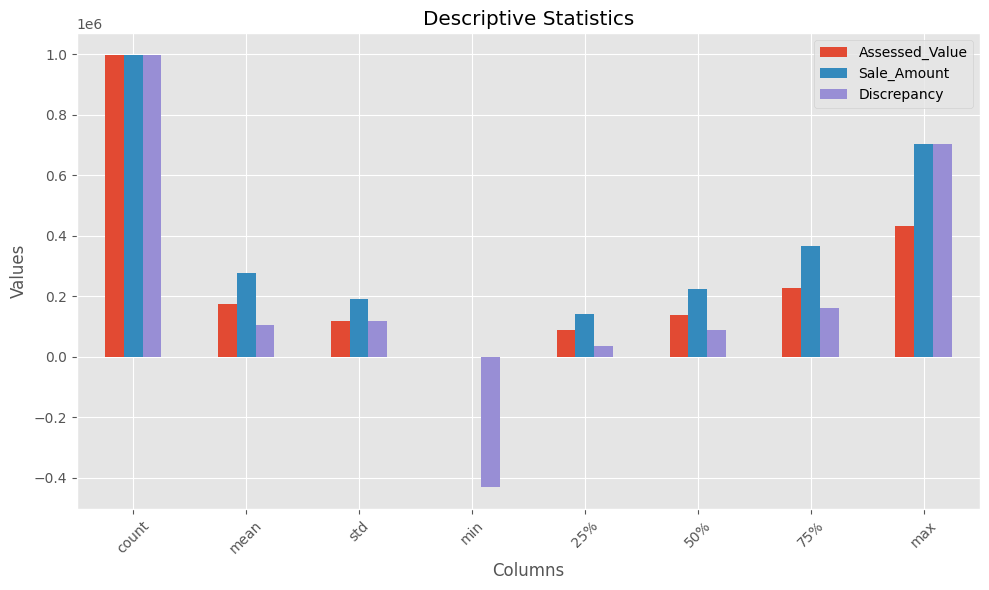

In [53]:
#Plotting bar chart to show the statistical analysis(summary) for Assessed value, Sale amount and Discrepancy
# Plotting the bar chart
Summary_data.plot(kind='bar', figsize=(10, 6), rot = 45)
plt.title('Descriptive Statistics')
plt.xlabel('Columns')
plt.ylabel('Values')
plt.xticks(rotation=45)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

### ***INSIGHT GENERATED***

- The minimum value for Assessed value, sales amount is 0 and that of Discrepancy is -432,500 indicating cases where the assessed value is higher than the sale amount.

- The maximum value for Assessed value and sales amount are 432500 and 702500 respectively. For discrepancy, we have the maximum value of 702,500 indicating cases where the sale amount is higher than the assessed value.

-  The mean value for the Assessed value is 172,333, and the mean value for the Sale amount is 997,213 making the sale amount the highest average between the assessed value and sales
.
- The mean Discrepancy between Assessed_Value and Sale_Amount is 103,862
.
- 25% of the data falls below these values: Assessed_Value 87,600, Sale_Amount 140,000, Discrepancy 35,920
.
- Half of the data falls below these values: Assessed_Value 138,390, Sale_Amount 225,000, and Discrepancy 86,600*

#### ***Visualization of Discrepancies***

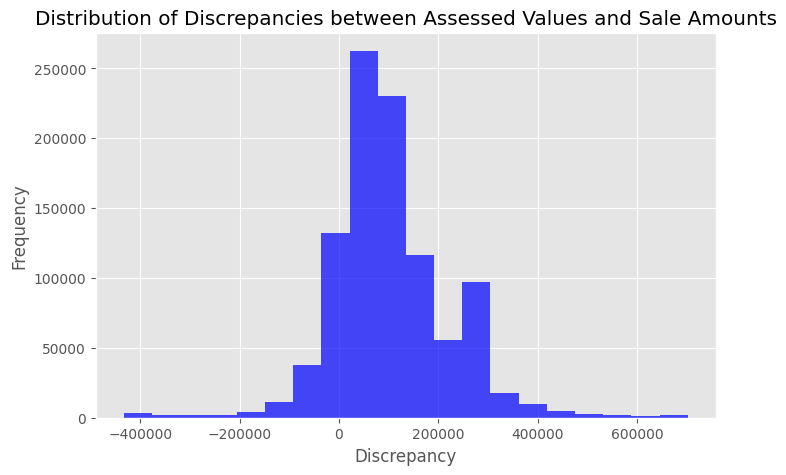

In [54]:
# Visualize discrepancies
plt.figure(figsize=(8, 5))
plt.hist(Data_cleaned['Discrepancy'], bins=20, color='blue', alpha=0.7)
plt.title('Distribution of Discrepancies between Assessed Values and Sale Amounts')
plt.xlabel('Discrepancy')
plt.ylabel('Frequency')
plt.show()

### ***INSIGHT GENERATED***

- The graph illustrates the distribution of discrepancies, showing how frequently different levels of discrepancies occur in the dataset. It suggests that discrepancies of 0 to 200,000 are more frequent compared to larger discrepancies, with a decrease in frequency as the discrepancies become larger in either direction. it suggests that many properties have assessed values close to 200,000 but are sold at different amounts.

- There are fewer properties with discrepancies beyond this range, with a peak around 0 indicating a relatively common level of agreement between assessed and sale values.

- By analyzing the graph, you can identify common discrepancies and outliers. Properties with significant differences between assessed values and sale amounts can be further investigated to understand the reasons behind these discrepancies and improve the accuracy of property assessments.

`RECOMMENDATION: Improve the accuracy of property assessments and ensure consistency between assessed values and actual sale amounts.`

## ***OBJECTIVE TWO***

 - `Market Trends`: Analyze sales ratios to uncover trends in property market values, understanding how sale amounts relate to the assessed values across different property types and residential classifications.




#### ***Steps To achieve the above objective:***
- Calculate the sales ratio for each property by dividing the sale amount by the assessed value.

- Group the data by property types and residential classifications to analyze sales ratios within each category.

- Calculate summary statistics such as mean, median, and standard deviation of sales ratios for each category.

- Use visualizations (e.g., line plots, box plots) to analyze trends in sales ratios across different categories. You can also perform statistical tests to compare sales ratios between groups.

- Analyze trends using the mean Sales Ratio of each group. 

In [55]:
#unique count for Property_Type and Residential Type
Prop_Res_Type = Data_cleaned.loc[:, "Property_Type": "Residential_Type"]

Unique_count = Prop_Res_Type.nunique()

#the unique names
Unique_values = {}
for column in Prop_Res_Type.columns:
    Unique_values[column] = Prop_Res_Type[column].unique()

# Display the unique values in each column
for column, values in Unique_values.items():
    print(f"Unique values in column '{column}': {values}\n")



# Display the results #count
print("Number of unique values in each column:")
print(Unique_count)



Unique values in column 'Property_Type': ['Commercial' 'Residential' 'Vacant Land' 'Single Family' 'Apartments'
 'Industrial' 'Public Utility' 'Condo' 'Two Family' 'Three Family'
 'Four Family']

Unique values in column 'Residential_Type': ['Single Family' 'Condo' 'Two Family' 'Three Family' 'Four Family']

Number of unique values in each column:
Property_Type       11
Residential_Type     5
dtype: int64


#### ***Calculate sales ratio***

In [56]:
#calculation of sales ratio
# A new sales ratio column is created because we have cleaned our data and handled outliers so there won't be accuracy if we use the existing sale ratio column. 
Data_cleaned["New_Sales_ratio"] = round(Data_cleaned["Assessed_Value"]/Data_cleaned["Sale_Amount"], 3)

#viewing the data to show the new column created
Data_cleaned.head()

,Serial_Number,List_Year,Date_Recorded,Town,Address,Assessed_Value,Sale_Amount,Sales_Ratio,Property_Type,Residential_Type,Non_Use_Code,Assessor_Remarks,OPM_remarks,Location,Discrepancy,New_Sales_ratio
0,334029,2020,2021-09-13,Ansonia,230 WAKELEE AVE,150500.0,325000.0,0.4630,Commercial,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461),174500.0,0.463
1,20002,2020,2020-10-02,Ashford,390 TURNPIKE RD,253000.0,430000.0,0.5883,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461),177000.0,0.588
2,200212,2020,2021-03-09,Avon,5 CHESTNUT DRIVE,130400.0,179900.0,0.7248,Residential,Condo,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461),49500.0,0.725
3,200243,2020,2021-04-13,Avon,111 NORTHINGTON DRIVE,432500.0,702500.0,0.6958,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461),270000.0,0.616
4,200377,2020,2021-07-02,Avon,70 FAR HILLS DRIVE,432500.0,702500.0,0.5957,Residential,Single Family,25 - Other,ESTATE SALE,GOOD SALE PER MLS,POINT (-72.36336 41.97461),270000.0,0.616


In [57]:
# Replace NaN and inf with 0 in 'New_Sales_ratio'
Data_cleaned['New_Sales_ratio'] = Data_cleaned['New_Sales_ratio'].replace([np.nan, np.inf], 0)

#let us run the statistical summary to get a reasonable output
Data_cleaned['New_Sales_ratio'].describe().round(2)

count    997213.00
mean          8.31
std        1331.74
min           0.00
25%           0.50
50%           0.62
75%           0.77
max      432500.00
Name: New_Sales_ratio, dtype: float64

### ***INSIGHT GENERATED***

- The mean sales ratio is 8, which suggests that, on average, it means that the assessed value of the property is 8 times greater than the price at which it was sold.. This could indicate a potential discrepancy between assessed values and actual sale amounts.

- With 25% value of 0.50 indicates the presence of observations where the assessed value exceeds the sale amount.

- A maximum sales ratio of 432,500 indicates that the assessed value of the property is 432,500 times higher than the sale amount.

- The summary statistics for the sales ratio indicate potential discrepancies between assessed values and actual sale amounts, with variability and outliers present in the dataset. This could suggest inconsistencies in property assessments or unique market conditions affecting property values.



#### ***Grouping the data and Summary statistics***

In [58]:
#grouping the data by property type and mean of sales ratio. 
Grouped_data_1 = Data_cleaned.groupby('Property_Type')['New_Sales_ratio'].mean().sort_values(ascending = False)

Grouped_data_1

Property_Type
Single Family     10.342963
Three Family       1.439782
Four Family        1.400026
Two Family         1.206031
Commercial         1.162044
Vacant Land        1.025067
Public Utility     0.960200
Industrial         0.863066
Condo              0.773366
Residential        0.633472
Apartments         0.568366
Name: New_Sales_ratio, dtype: float64

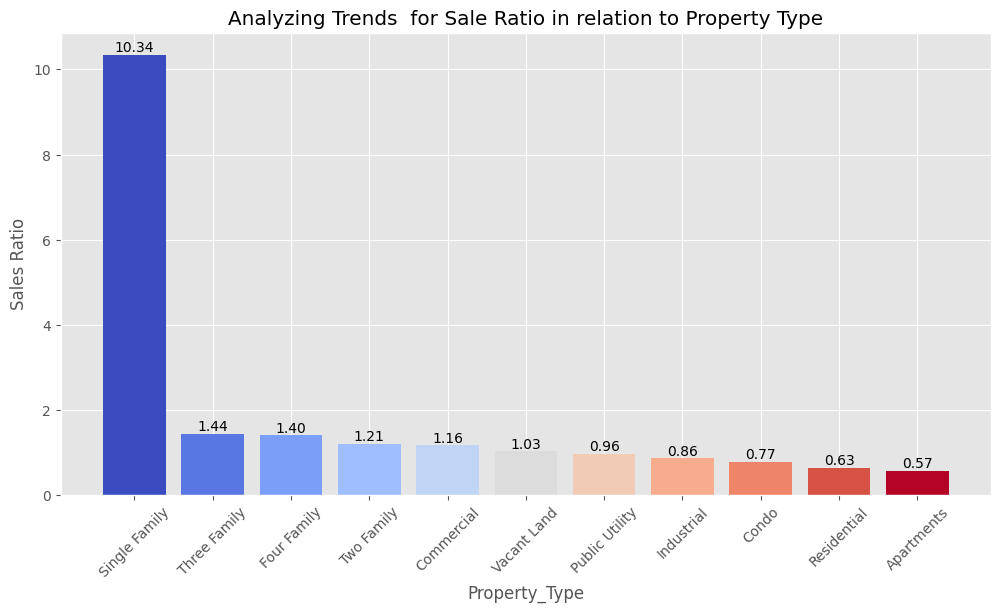

In [59]:
# Create a color gradient for the bars
colors = plt.cm.coolwarm(np.linspace(0, 1, len(Grouped_data_1)))

# Create the bar chart
plt.figure(figsize=(12, 6))
bars = plt.bar(Grouped_data_1.index, Grouped_data_1.values, color=colors)

# Add data labels to the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height,
             f'{height:.2f}', ha='center', va='bottom')

# Customize the chart
plt.xticks(rotation=45)
plt.xlabel('Property_Type')
plt.ylabel('Sales Ratio')
plt.title('Analyzing Trends  for Sale Ratio in relation to Property Type')

# Show the plot
plt.show()

### ***INSIGHT GENERATED***

- Single-family property types have a sales ratio of 10.34 which means that on average, the assessed value of Single Family homes is 10.34 times higher than their actual sale amounts, indicating strong demand or potentially overvalued properties in this category with their assessed values significantly exceeding their actual market sale prices.

- Three-family property types have a Sales Ratio of 1.44, indicating that their assessed value is about 1.44 times higher than their sale amounts on average.

- Four-Family property type shows a ratio of 1.40 which means their assessed value is approximately 1.40 times higher than their sale amounts.

- Two-family property type shows a ratio of 1.21 which means indicating that their assessed value is around 1.21 times higher than their sale amounts.

- For other property types that are in the range of 0.57 to 0.96 implies a lower Sales ratio, which means the assessed value is slightly or significantly lower than their sales amount suggesting a more balanced market or potentially undervalued properties in these categories.

In [60]:
#grouping the data by Residential type and mean of sales ratio. 
Grouped_data_2 = Data_cleaned.groupby('Residential_Type')['New_Sales_ratio'].mean().sort_values(ascending = False)

Grouped_data_2 

Residential_Type
Single Family    9.772636
Three Family     1.340371
Four Family      1.335931
Two Family       1.141516
Condo            0.753929
Name: New_Sales_ratio, dtype: float64

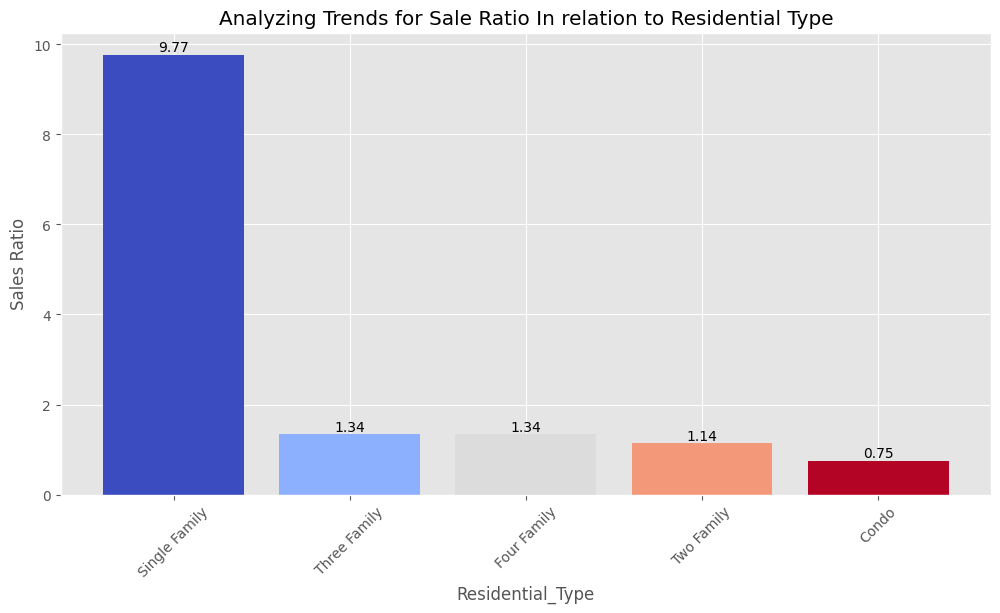

In [61]:
#bar chart to show clearer insights
colors = plt.cm.coolwarm(np.linspace(0, 1, len(Grouped_data_2)))

# Create the bar chart
plt.figure(figsize=(12, 6))
bars = plt.bar(Grouped_data_2.index, Grouped_data_2.values, color=colors)

# Add data labels to the bars
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height,
             f'{height:.2f}', ha='center', va='bottom')

# Customize the chart
plt.xticks(rotation=45)
plt.xlabel('Residential_Type')
plt.ylabel('Sales Ratio')
plt.title('Analyzing Trends for Sale Ratio In relation to Residential Type')

# Show the plot
plt.show()

### ***INSIGHT GENERATED***

- CONDO shows a Sales Ratio of 0.75, indicating that the sale amounts for Condos are 75% of the assessed values which means Condo residential types are selling below their assessed values, potentially indicating lower demand compared to other property types. This trend suggests challenges in the condo market, such as oversupply, pricing competitiveness, or valuation discrepancies.

- The four-family residential type shows a Sales Ratio of 1.34, meaning that the sale amounts for Four-family properties are approximately 134% of the assessed values which means Four-Family residential are selling at a premium compared to their assessed values, potentially reflecting higher demand or unique features of these properties.

- Single-family represent a significantly high Sales Ratio of 9.77, indicating which also means that, on average, the assessed value of Single Family homes is 9.77 times higher than their actual sale amounts indicating strong demand or potentially overvalued properties in this category. This trend suggests a robust market for single-family homes. 

- Three-Family shows a Sales Ratio of 1.34, suggesting that the sale amounts for the Three-Family residential type are about 134% of the assessed values which also means the Three-Family residential type is selling at a premium compared to their assessed values, potentially reflecting market demand or unique characteristics of these properties.

- Two-Family displays a Sales Ratio of 1.14,  indicating that the assessed values for two-family properties are approximately 1.14 times higher than their corresponding sale amounts on average that is selling slightly above its assessed value. 




`RECOMMENDATION: Stakeholders should leverage market insights to tailor strategies, identify opportunities, and address challenges specific to each property category`

In [62]:
##Group the sales ratio by Year #Additional Insight.
Grouped_data_3 = Data_cleaned.groupby('List_Year')['New_Sales_ratio'].mean().astype('int').sort_values(ascending = False)

Grouped_data_3

List_Year
2005    71
2006    34
2018     8
2004     6
2003     4
2002     3
2001     1
2013     1
2017     1
2015     1
2014     1
2011     1
2012     1
2010     1
2009     1
2008     1
2007     1
2016     0
2019     0
2020     0
Name: New_Sales_ratio, dtype: int32

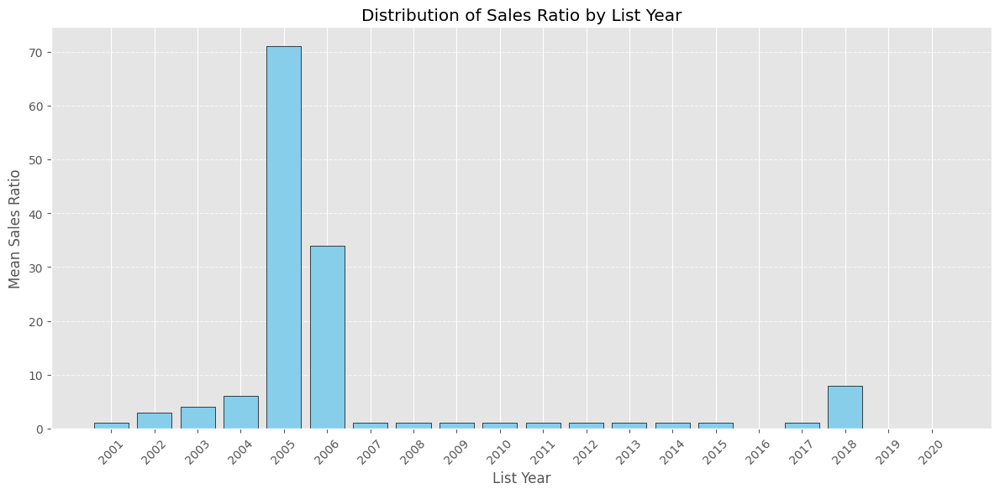

In [63]:
#bar chart to show clearer insights 
plt.figure(figsize=(12, 6))
plt.bar(Grouped_data_3.index, Grouped_data_3.values, color='skyblue',edgecolor = 'black')

# Adding labels and title
plt.xlabel('List Year')
plt.ylabel('Mean Sales Ratio')
plt.title('Distribution of Sales Ratio by List Year')

# Display the plot
plt.xticks(Grouped_data_3.index.astype(int), rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### ***INSIGHT GENERATED***

- The plot indicates how the Mean Sales Ratio has varied over the years from 2001 to 2020.

- It helps in understanding how sales ratios have evolved and identifying any significant changes or trends in property sales relative to assessed values.

- Based on the plot provided, the year with the highest average Sales Ratio appears to be 2011. This conclusion is drawn from the peak point on the graph, indicating that 2011 had the highest average Sales Ratio compared to the other years from 2001 to 2020.

## ***OBJECTIVE THREE***

***Geographical Analysis: Investigate variations in assessed values, sales amounts, and market ratios across different towns, providing a localized understanding of real estate dynamics***


- Calculate average assessed values, sales amounts, and market ratios for each town.

- Compare the data across towns to identify variations and trends.

- Create visualizations such as bar graphs, scatter plots, or maps to represent the data effectively.

- Look for patterns or correlations between assessed values, sales amounts, and market ratios in different towns.

In [64]:
#Check the number of values in the Town column. 
Data_cleaned["Town"].nunique()

170

In [65]:
#value count #Top 30 Towns with the highest count 
Town_count = Data_cleaned["Town"].value_counts()[:30]
Town_count

Town
Bridgeport       34201
Stamford         32529
Waterbury        28506
Norwalk          23960
New Haven        21346
Danbury          20350
West Hartford    19854
Hartford         18810
Milford          17749
Meriden          17502
Greenwich        17390
Bristol          16915
Stratford        16688
New Britain      16405
Manchester       16380
Hamden           16192
Fairfield        15898
East Hartford    13732
Torrington       13172
Middletown       12403
West Haven       12308
Southington      11979
Wallingford      11915
Norwich          11908
Shelton          11869
Glastonbury      11828
Enfield          10896
Trumbull          9785
Groton            9683
Westport          9198
Name: count, dtype: int64

***Bridgeport have the highest value count of 34,201 which makes it the most frequently occuring town***

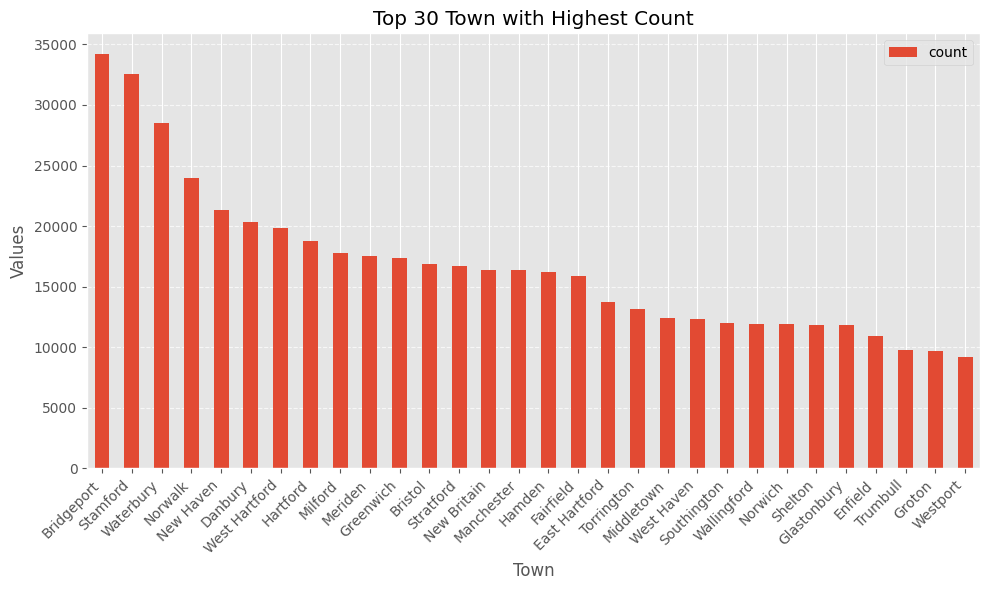

In [66]:
#plot for the Town count. 
Town_count.plot(kind='bar', figsize=(10, 6), rot = 45)
plt.title('Top 30 Town with Highest Count')
plt.xlabel('Town')
plt.ylabel('Values')
plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels by 45 degrees and align them to the right
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(loc='upper right')
plt.tight_layout()
plt.show()

***The plot shows the Top 30 most frequently occuring town and we have Bridgeport and Stamford having the highest count.***


### ***VARIATION OF ASSESSED VALUES AND SALE AMOUNT ACROSS DIFFERENCT TOWNS.*** 

In [67]:
#sorting by Assessed Value from the highest Assessed value 
Grouped_Town_1 = Data_cleaned.groupby('Town')[["Assessed_Value", "Sale_Amount"]].mean().astype('int').sort_values(by='Assessed_Value', ascending=False)
Grouped_Town_1

,Assessed_Value,Sale_Amount
Town,,
New Canaan,412950,653336
Darien,406199,659238
Greenwich,401119,645795
Weston,395591,621962
Westport,392950,641729
...,...,...
Torrington,98492,147401
Windham,89495,138276
Waterbury,84142,126027


- ***We are limiting the rows the first 30 Towns alone with ordering by Assessed value because we don't want untidy, hard-to-read and clustered plot so that we can have better understanding of the insight.***

In [68]:
Grouped_Town = Data_cleaned.groupby('Town')[["Assessed_Value", "Sale_Amount"]].mean().astype('int').sort_values(by='Assessed_Value', ascending=False)[:30]
Grouped_Town

,Assessed_Value,Sale_Amount
Town,,
New Canaan,412950,653336
Darien,406199,659238
Greenwich,401119,645795
Weston,395591,621962
Westport,392950,641729
Wilton,376290,605932
Easton,350174,538497
Redding,335228,518088
Ridgefield,334049,543544


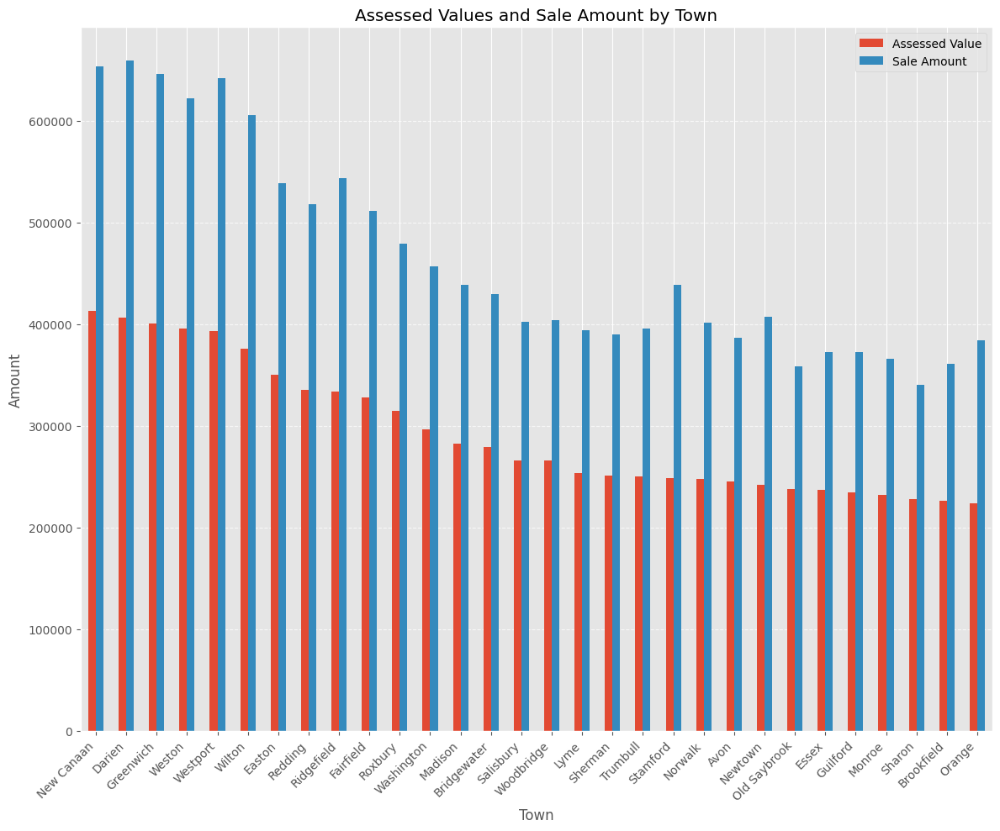

In [69]:
#plot for the Grouped Town along with its Assessed value and Sale Value
Grouped_Town.plot(kind='bar', figsize=(12, 10))
plt.title('Assessed Values and Sale Amount by Town')
plt.xlabel('Town')
plt.ylabel('Amount')
plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels by 45 degrees and align them to the right
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(["Assessed Value", "Sale Amount"])
plt.tight_layout()
plt.show()

### ***INSIGHT GENERATED***

- Based on the plot generated, we can compare the assessed value and sale amount grouped by Town.

- New Canaan has the highest average Assessed value of 412,950 followed by Darien with an average assessed value of 406,199 and then Greenwich with an average assessed value of 401,119.

- The average sale amounts seem to vary across towns, with some towns like New Canaan and Darien having higher sale amounts compared to others.



`RECOMMENDATION: Conduct detailed market analysis in towns with lower average assessed values but higher sale amounts to understand the dynamics driving sales in those areas. There may be opportunities for growth or development.`


### ***VARIATION OF MARKET RATIOS ACROSS DIFFERENT TOWNS.*** 

In [70]:
#View All Towns
Grouped_Town_1['Market_Ratio'] = Grouped_Town_1['Assessed_Value'] / Grouped_Town_1['Sale_Amount']

#Viewing the data

Grouped_Town_1

,Assessed_Value,Sale_Amount,Market_Ratio
Town,,,
New Canaan,412950,653336,0.632064
Darien,406199,659238,0.616164
Greenwich,401119,645795,0.621124
Weston,395591,621962,0.636037
Westport,392950,641729,0.612330
...,...,...,...
Torrington,98492,147401,0.668191
Windham,89495,138276,0.647220
Waterbury,84142,126027,0.667651


In [71]:
#summary statistics on all towns
Grouped_Town_1["Market_Ratio"].describe().round(2)

count    170.00
mean       0.63
std        0.06
min        0.24
25%        0.61
50%        0.63
75%        0.65
max        1.13
Name: Market_Ratio, dtype: float64

***INSIGHT GENERATED***

- `Average` market ratio is at 0.63 and the `maximum` market ratio has a value of 1.31, `minimum` value of 0.24


In [72]:
# Sorting by the highest market ratio 
Grouped_Town_1_sorted = Grouped_Town_1.sort_values(by='Market_Ratio', ascending = False)

Grouped_Town_1_sorted

,Assessed_Value,Sale_Amount,Market_Ratio
Town,,,
Stafford,156011,137847,1.131769
Preston,161903,190533,0.849737
Bridgeport,133221,173217,0.769099
Colebrook,150600,209781,0.717892
North Canaan,126578,177873,0.711620
...,...,...,...
Rocky Hill,137957,250911,0.549824
Warren,196991,365114,0.539533
Beacon Falls,125413,241324,0.519687


***INSIGHT GENERATED***

- `Stafford` has the highest market ratio indicating assessed values are slightly higher than sale amounts on average.

- `Preston` has a market ratio of around 0.85, suggesting suggests that properties in Preston are selling below their assessed values, potentially indicating a buyer's market or lower demand compared to other areas where properties might sell closer to or above their assessed values.

- While the Town registered with the name `***Unknown***` and `Hartford` have the lowest market ratio.

- `Hartford` has the lowest market ratio among the listed towns at around 0.44, indicating a significant discrepancy between assessed values and sale amounts, possibly indicating challenges in the real estate market or other factors affecting property values in this area.


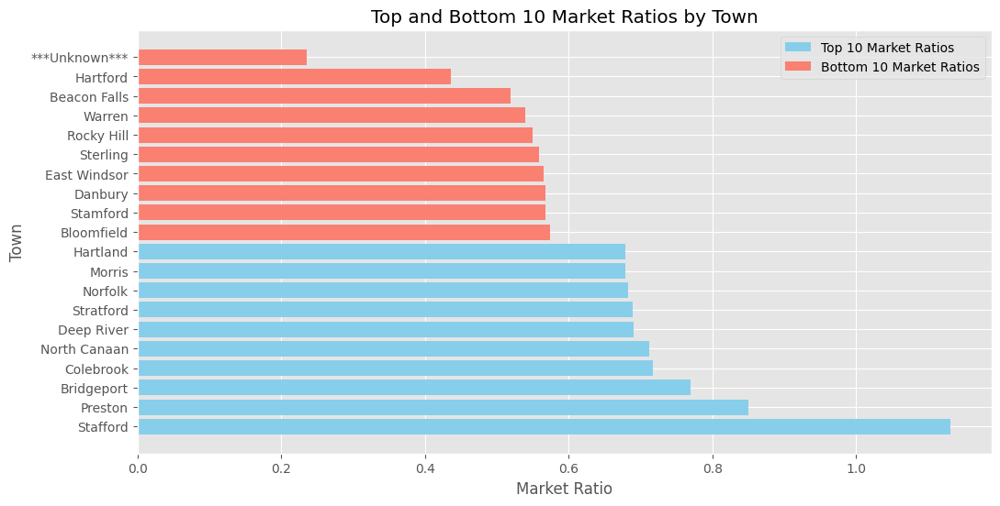

In [73]:
#Plot for the Grouped_Town_1_sorted data to view the towns with the highest and lowest Market Ratio

# Selecting the top 10 and bottom 10 market ratios
Top_10_market_ratio = Grouped_Town_1_sorted['Market_Ratio'].head(10)
Bottom_10_market_ratio = Grouped_Town_1_sorted['Market_Ratio'].tail(10)

#Creating combined plot for top 10 and bottom 10. 
plt.figure(figsize=(12, 6))
plt.barh(Top_10_market_ratio.index, Top_10_market_ratio, color='skyblue', label='Top 10 Market Ratios')
plt.barh(Bottom_10_market_ratio.index, Bottom_10_market_ratio, color='salmon', label='Bottom 10 Market Ratios')
plt.xlabel('Market Ratio')
plt.ylabel('Town')
plt.title('Top and Bottom 10 Market Ratios by Town')
plt.legend()
plt.show()

- `Market_Ratio`: Indicates the market ratio which is calculated as the ratio of Assessed_Value to Sale_Amount. It provides insight into how the assessed value compares to the actual sale amount.




***When a town has the highest market ratio, it typically indicates that properties in that town are being assessed at a higher value relative to their sale amount. In other words, the assessed values of properties in that town are higher compared to the actual sale prices of those properties*** which implies:

- It could also reflect unique market conditions in that town, such as limited housing supply or high demand, influencing property values and assessments.

- The town may be highly desirable, leading to inflated property values and higher assessments compared to actual sale prices.

- Properties in that town may be overvalued.


***When a town has the lowest market ratio, it typically means that properties in that town are being assessed at a lower value relative to their sale amount. In this scenario, the assessed values of properties are lower compared to the actual sale prices of those properties*** which implies:

- The properties in that town may be undervalued.

- The town may be facing challenges such as declining property values, low demand, or oversupply, leading to lower assessments compared to actual sale prices.

- It could also point to potential issues with property assessments, where properties are not being valued accurately based on market conditions.






## ***OBJECTIVE FOUR***

 - Property Type Impact: Examine the impact of property type on assessment accuracy and market trends, exploring whether certain types (e.g., residential, commercial) exhibit a distinct pattern.

#### ***Algorithm To achieve the above objective:***

- Group the data by property type (e.g., residential, commercial).

- Calculate descriptive statistics for both groups to understand the assessment accuracy and market trends separately.

- Calculate assessment accuracy metrics for each property type.

- Visualize the assessment accuracy metrics for different property types to identify any discrepancies or patterns.

- Analyze market trends by property type. This could involve examining how sale amounts relate to assessed values across different property types.



In [74]:
#Group the data by property type
Grouped_Property = Data_cleaned.groupby('Property_Type')[["Assessed_Value", "Sale_Amount"]].describe()

Grouped_Property

Assessed_Value                                         \
                        count           mean            std      min   
Property_Type                                                          
Apartments              486.0  245615.528807  141429.028154      0.0   
Commercial             1981.0  292558.170116  138892.502083      0.0   
Condo                105420.0  140214.620063   98417.916314      0.0   
Four Family            2150.0  172435.642326   82159.971885   6670.0   
Industrial              228.0  319714.960526  142302.333269  24570.0   
Public Utility            5.0   73466.000000   59188.776216  18490.0   
Residential           60728.0  193810.797392  117838.987690      0.0   
Single Family        784058.0  176449.057582  121065.368993      0.0   
Three Family          12586.0  133967.745352   75032.905743      0.0   
Two Family            26408.0  146175.059906   80808.951797      0.0   
Vacant Land            3163.0   84335.948783   98891.288527      0.0   

                                                        Sale_Amount  \
                      25%       50%       75%       max       count   
Property_Type                                                         
Apartments      139362.50  206745.0  432500.0  432500.0       486.0   
Commercial      162400.00  317000.0  432500.0  432500.0      1981.0   
Condo            74559.25  114290.0  179300.0  432500.0    105420.0   
Four Family     119140.00  154920.0  204515.0  432500.0      2150.0   
Industrial      177420.00  432500.0  432500.0  432500.0       228.0   
Public Utility   34510.00   42200.0  117920.0  154210.0         5.0   
Residential     105840.00  158410.0  255740.0  432500.0     60728.0   
Single Family    88200.00  141540.0  234290.0  432500.0    784058.0   
Three Family     81400.00  123780.0  165822.5  432500.0     12586.0   
Two Family       94707.50  126845.0  171430.0  432500.0     26408.0   
Vacant Land      19665.00   54940.0  100080.0  432500.0      3163.0   

                                                                           \
                         mean            std      min       25%       50%   
Property_Type                                                               
Apartments      435154.697531  219334.147670  20000.0  266250.0  400000.0   
Commercial      418306.298839  246332.947377   4500.0  187000.0  400000.0   
Condo           219376.208734  157493.072834      0.0  112500.0  175000.0   
Four Family     218410.870233  153515.657363      0.0  106000.0  189450.0   
Industrial      488752.372807  246182.361195  15000.0  235000.0  645000.0   
Public Utility  230208.800000  288990.717562  34594.0   39000.0   59950.0   
Residential     340494.186377  192016.558189   2000.0  195000.0  290000.0   
Single Family   283433.013226  193198.904695      0.0  145000.0  231000.0   
Three Family    175436.212220  126063.824973   1671.0   82000.0  153000.0   
Two Family      188617.409679  134933.024217      0.0   92000.0  162000.0   
Vacant Land     184282.808283  207634.270415   2000.0   41000.0  100000.0   

                                    
                     75%       max  
Property_Type                       
Apartments      702500.0  702500.0  
Commercial      702500.0  702500.0  
Condo           285000.0  702500.0  
Four Family     282750.0  702500.0  
Industrial      702500.0  702500.0  
Public Utility  315000.0  702500.0  
Residential     455000.0  702500.0  
Single Family   375000.0  702500.0  
Three Family    235000.0  702500.0  
Two Family      241512.5  702500.0  
Vacant Land     235000.0  702500.0

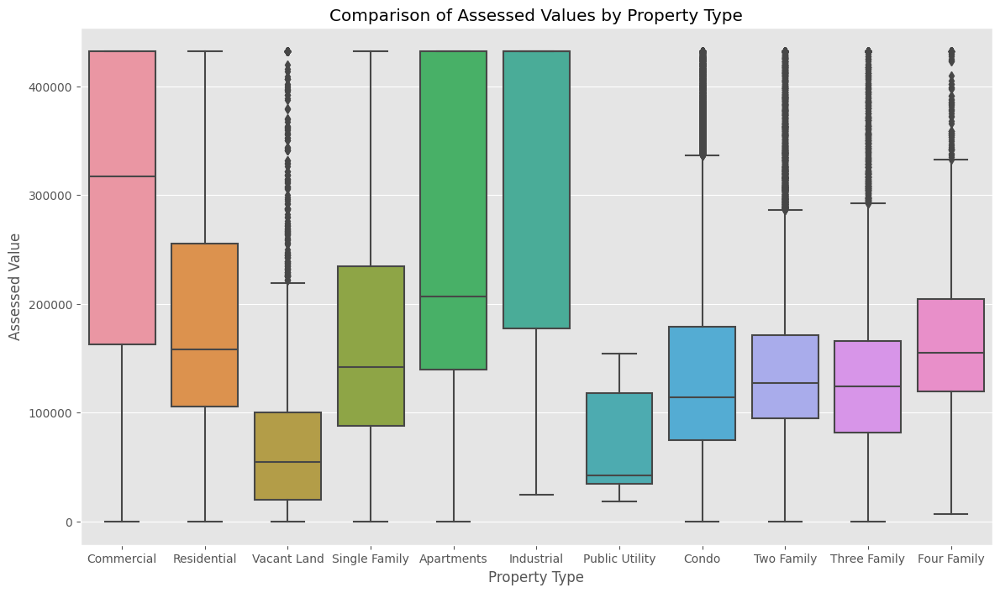

In [75]:
# Visualization
# Box plot for comparison of assessed values by property type
plt.figure(figsize=(14, 8))
sns.boxplot(x='Property_Type', y='Assessed_Value', data=Data_cleaned)
plt.title('Comparison of Assessed Values by Property Type')
plt.xlabel('Property Type')
plt.ylabel('Assessed Value')
plt.show()

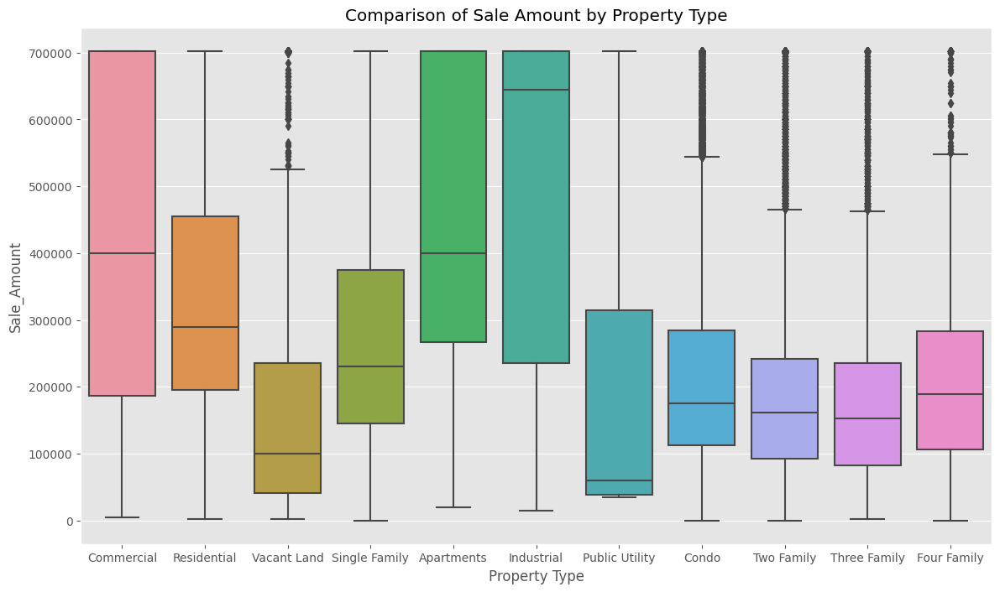

In [76]:
# Box plot for comparison of Sales Amount by property type
plt.figure(figsize=(14, 8))
sns.boxplot(x='Property_Type', y='Sale_Amount', data=Data_cleaned)
plt.title('Comparison of Sale Amount by Property Type')
plt.xlabel('Property Type')
plt.ylabel('Sale_Amount')
plt.show()

#### ***The boxplots above show the Comparison of Sales amount and Assessed value by Property type. It shows the descriptive analysis to understand the market trend better.***

### ***Visualization showing the Mean Assessed Value and Sales Amount by Property Type***

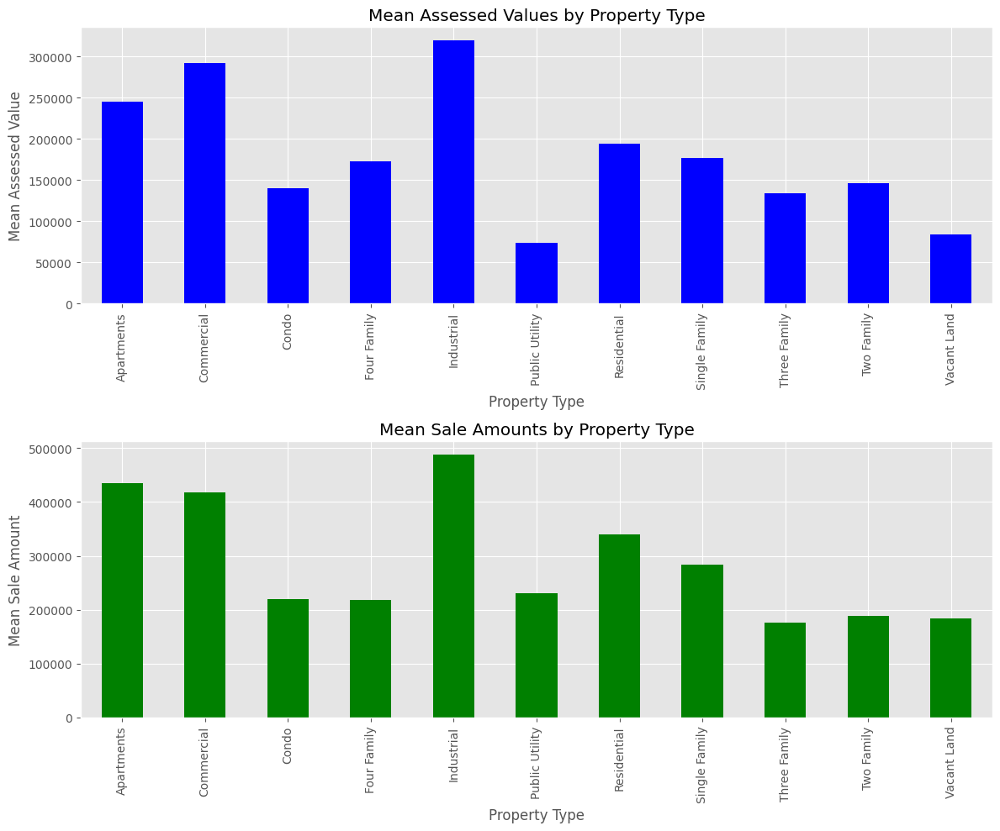

In [77]:
# Create a figure and axis object with subplots
fig, axs = plt.subplots(2, figsize=(12, 10))

# Plot mean assessed values by property type
mean_assessed_values = Grouped_Property['Assessed_Value']['mean']
mean_assessed_values.plot(kind='bar', ax=axs[0], color='blue')
axs[0].set_title('Mean Assessed Values by Property Type')
axs[0].set_xlabel('Property Type')
axs[0].set_ylabel('Mean Assessed Value')

# Plot mean sale amounts by property type
mean_sale_amounts = Grouped_Property['Sale_Amount']['mean']
mean_sale_amounts.plot(kind='bar', ax=axs[1], color='green')
axs[1].set_title('Mean Sale Amounts by Property Type')
axs[1].set_xlabel('Property Type')
axs[1].set_ylabel('Mean Sale Amount')

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

*Fron the above Mean plots by Property type for both Sales Amount and Assessed Value:*

- `Industrial` Property type have the highest average of `Assesment Value` and `Sale Amount`.

- `Public Utility` Property type have the lowest average of `Assessment Value` and Three-Family property type have the lowest average of `Sales Amount.`

### ***ASSESSMENT ACCURACY METRICS FOR DIFFERENT PROPERTY TYPE***

In [78]:
# Calculate assessment accuracy metrics for each property type
accuracy_metrics = Data_cleaned.groupby("Property_Type")[['Assessed_Value', 'Sale_Amount']].agg(['mean', 'median', 'std', 'min', 'max'])

print(accuracy_metrics)


               Assessed_Value                                              \
                         mean    median            std      min       max   
Property_Type                                                               
Apartments      245615.528807  206745.0  141429.028154      0.0  432500.0   
Commercial      292558.170116  317000.0  138892.502083      0.0  432500.0   
Condo           140214.620063  114290.0   98417.916314      0.0  432500.0   
Four Family     172435.642326  154920.0   82159.971885   6670.0  432500.0   
Industrial      319714.960526  432500.0  142302.333269  24570.0  432500.0   
Public Utility   73466.000000   42200.0   59188.776216  18490.0  154210.0   
Residential     193810.797392  158410.0  117838.987690      0.0  432500.0   
Single Family   176449.057582  141540.0  121065.368993      0.0  432500.0   
Three Family    133967.745352  123780.0   75032.905743      0.0  432500.0   
Two Family      146175.059906  126845.0   80808.951797      0.0  432500.0   

### ***INSIGHT GENERATED***

- From the plot, the `maximum assessed value` for all property type have almost the same values and same goes for Sale amount as well with value of 702,500.

- The `minimum value` assessed value for all property is 0 aside from Four-Family, Industrial, and Public Utility. 

- `Industrial` Property type have the highest average of `Assesment Value` and `Sale Amount`.

- `Public Utility` Property type have the lowest average of `Assessment Value` and Three-Family property type have the lowest average of `Sales Amount.`

### ***VISUALIZATION OF ASSESSMENT ACCURACY METRICS FOR DIFFERENT PROPERTY TYPE***

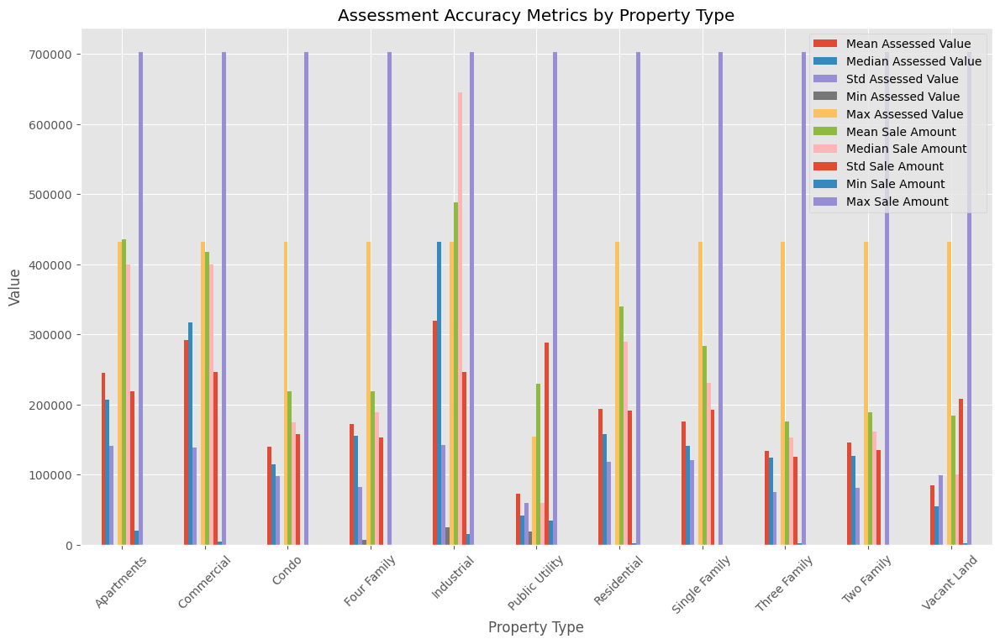

In [79]:
 # Selecting specific property types and metrics
selected_metrics = accuracy_metrics.loc[:, [('Assessed_Value', 'mean'), ('Assessed_Value', 'median'),
                                            ('Assessed_Value', 'std'), ('Assessed_Value', 'min'),
                                            ('Assessed_Value', 'max'), ('Sale_Amount', 'mean'),
                                            ('Sale_Amount', 'median'), ('Sale_Amount', 'std'),
                                            ('Sale_Amount', 'min'), ('Sale_Amount', 'max')]]

# Plotting grouped bar plot
selected_metrics.plot(kind='bar', figsize=(14, 8))
plt.title('Assessment Accuracy Metrics by Property Type')
plt.xlabel('Property Type')
plt.ylabel('Value')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.legend(['Mean Assessed Value', 'Median Assessed Value', 'Std Assessed Value', 'Min Assessed Value',
            'Max Assessed Value', 'Mean Sale Amount', 'Median Sale Amount', 'Std Sale Amount',
            'Min Sale Amount', 'Max Sale Amount'])

-  Across all property types, there are variations in the mean, standard deviation, minimum, maximum, and quartile values for both assessed values and sale amounts. These differences indicate discrepancies in property valuations and market transactions across different property types.



## ***OBJECTIVE FIVE***

 -Non-Use Code Insights: Explore the significance of non-use codes in property assessment, investigating how these codes influence assessed values and sales transactions.


 - Non-use codes are codes used in property assessment to classify properties based on their designated use or non-use status.


#### ***Algorithm To achieve the above objective:***

- Examine the distribution of non-use codes to understand their frequency and diversity.

- Visualize the distribution of assessed values and sales transactions for different non-use codes.

- Calculate descriptive statistics (mean, median, standard deviation, etc.) of assessed values and sales transactions grouped by non-use codes.


#### ***Distribution of Non_use codes***

In [80]:
Dist_NUC = Data_cleaned["Non_Use_Code"].value_counts()

#view value count
Dist_NUC

Non_Use_Code
25 - Other                 767448
14 - Foreclosure            52445
07 - Change in Property     34248
08 - Part Interest          15496
7.0                         14381
                            ...  
38.0                            1
48.0                            1
68.0                            1
33                              1
75                              1
Name: count, Length: 106, dtype: int64

In [81]:
#unique columns 
Data_cleaned["Non_Use_Code"].nunique()

#it has 106 unique items/values. 

106

In [82]:
#Showing the Highest Non_Use_Code
highest_NUC = Dist_NUC.idxmax()
print("The highest Non_Use_Code is:", highest_NUC)

The highest Non_Use_Code is: 25 - Other


#### ***Distribution of Assessed values and Sale Amount by Non_Use_Code***

In [85]:
Grouped_NUC = Data_cleaned.groupby('Non_Use_Code')[['Assessed_Value', 'Sale_Amount']].mean().astype(int)

#view 
Grouped_NUC

,Assessed_Value,Sale_Amount
Non_Use_Code,,
01 - Family,178524,191953
02 - Love and Affection,175043,173930
03 - Inter Corporation,231649,291713
04 - Correcting Deed,170829,202151
05 - Deed Date,208400,278398
...,...,...
8.0,160370,133531
88,43400,70000
9,41303,35366


### ***SORTING BY HIGHEST NUC VALUES***

In [86]:
#Selecting the Top 20 values from Dist_NUC
Top_30_NUC = Dist_NUC.head(30)

Top_30_NUC

Non_Use_Code
25 - Other                      767448
14 - Foreclosure                 52445
07 - Change in Property          34248
08 - Part Interest               15496
7.0                              14381
01 - Family                      13097
7                                 9421
1.0                               6057
10 - A Will                       5134
8.0                               5107
06 - Portion of Property          4378
28 - Use Assessment               4358
1                                 4160
18 - In Lieu Of Foreclosure       3677
25.0                              3552
8                                 3480
15 - Government Agency            3364
6.0                               3355
03 - Inter Corporation            3025
25                                2908
24 - Plottage                     2656
14.0                              2444
6                                 2165
11 - Court Order                  2163
14                                1940
3.0         

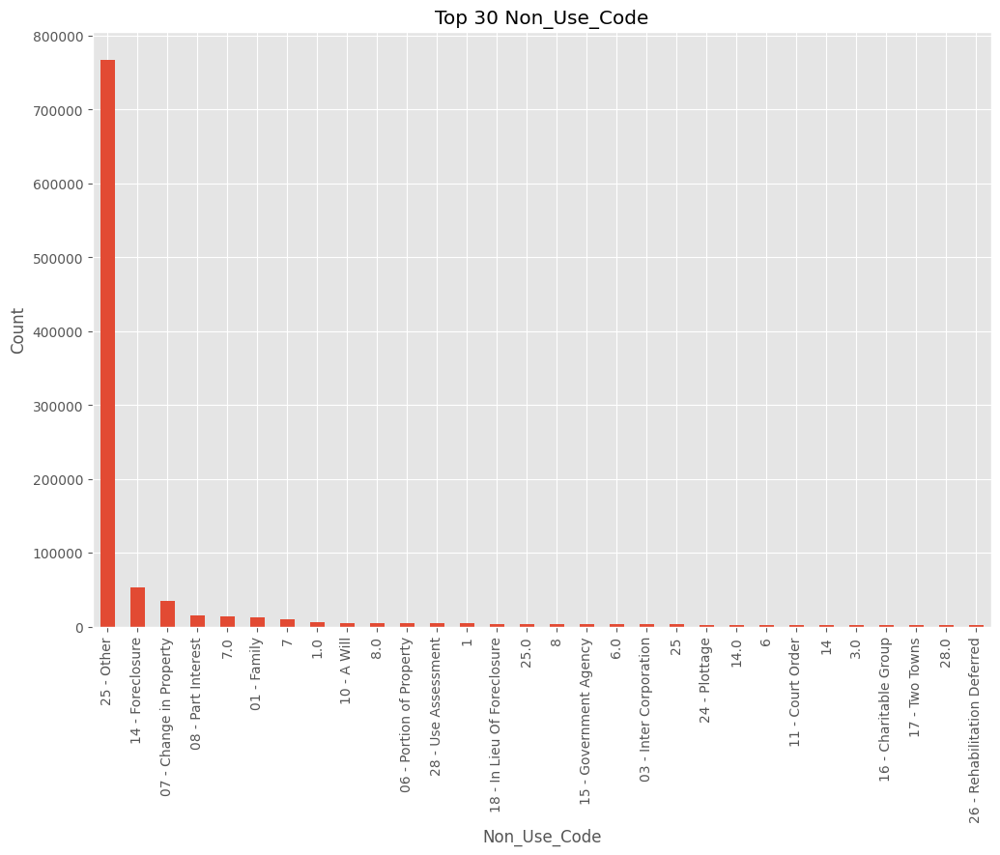

In [87]:
# Setting a larger figure size
plt.figure(figsize=(12, 8))

# Plotting the top 20 values of Non_Use_Code
Top_30_NUC.plot(kind='bar')
plt.title('Top 30 Non_Use_Code')
plt.xlabel('Non_Use_Code')
plt.ylabel('Count')
plt.show()

- From the graph above, 25-Other  has the highest value count followed by 14-Foreclosure and 07-change in Property. 

In [88]:
Selected_Non_Use_Code = ["25 - Other", "08 - Part Interest", "14 - Foreclosure","01 - Family", "02 - Love and Affection", "03 - Inter Corporation", "04 - Correcting Deed","05 - Deed Date"]
Selected_Non_Use_Code
#we just need to use a sample so that we can get a readable and understandable visualization

['25 - Other',
 '08 - Part Interest',
 '14 - Foreclosure',
 '01 - Family',
 '02 - Love and Affection',
 '03 - Inter Corporation',
 '04 - Correcting Deed',
 '05 - Deed Date']

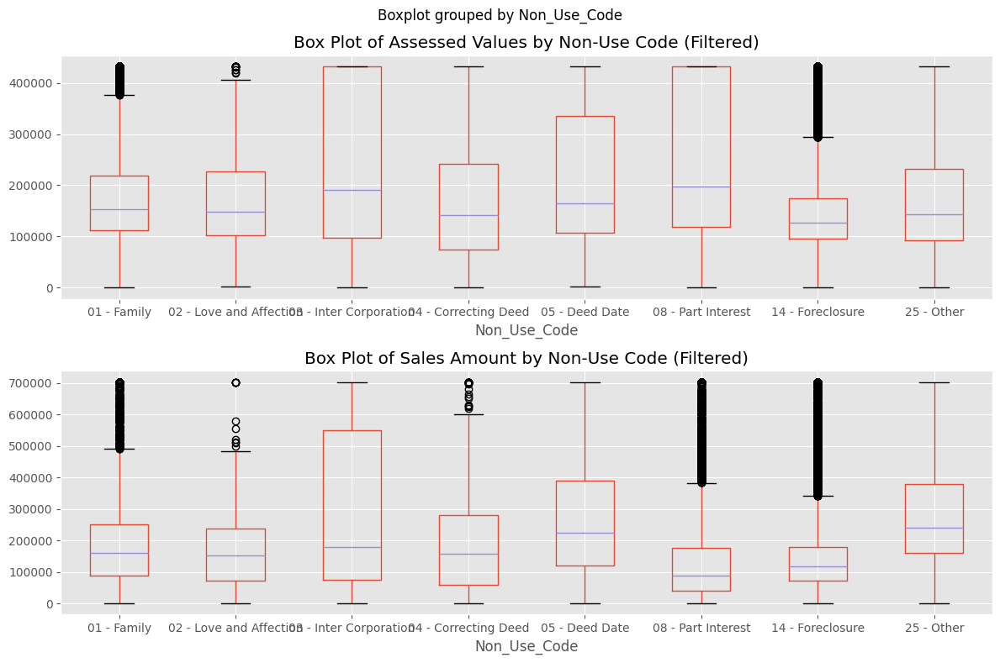

In [89]:
# Create visualizations to represent the data
filtered_data = Data_cleaned[Data_cleaned["Non_Use_Code"].isin(Selected_Non_Use_Code)]

# Create visualizations to represent the filtered data
fig, ax = plt.subplots(2, 1, figsize=(12, 8))

# Box plot for Assessed Values by Non-Use Code (filtered data)
filtered_data.boxplot(column='Assessed_Value', by='Non_Use_Code', ax=ax[0])
ax[0].set_title('Box Plot of Assessed Values by Non-Use Code (Filtered)')


# Histogram for Sale Amounts by Non-Use Code (filtered data)
filtered_data.boxplot(column='Sale_Amount', by='Non_Use_Code', ax=ax[1])
ax[1].set_title('Box Plot of Sales Amount by Non-Use Code (Filtered)')

plt.tight_layout()
plt.show()

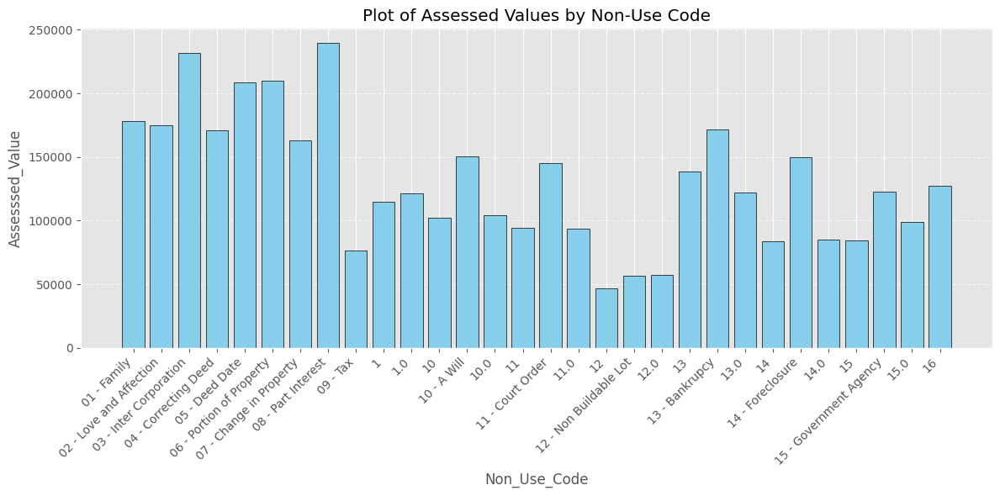

In [90]:
#plot for the Grouped Non_Use Code in respect to Assessed value (#this is just a sample because the values  for the non_use_code column is many so it will get clustered)


#limiting to the Grouped_NUC1 dataframe to 30 rows only so that we have a clearer view of the visualization
Sample_Grouped_NUC = Grouped_NUC.head(30)

#bar chart to show clearer insights 
plt.figure(figsize=(12, 6))
plt.bar(Sample_Grouped_NUC.index, Sample_Grouped_NUC["Assessed_Value"], color='skyblue',edgecolor = 'black')

# Adding labels and title
plt.xlabel('Non_Use_Code')
plt.ylabel('Assesssed_Value')
plt.title('Plot of Assessed Values by Non-Use Code')

# Display the plot
# Display the plot
plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels by 45 degrees and align them to the right
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

- ### ***We limited the rows so that our dataset won't be clustered because we don't want an untidy, hard-to-read, and clustered plot so that we can have a better understanding of the insight.***

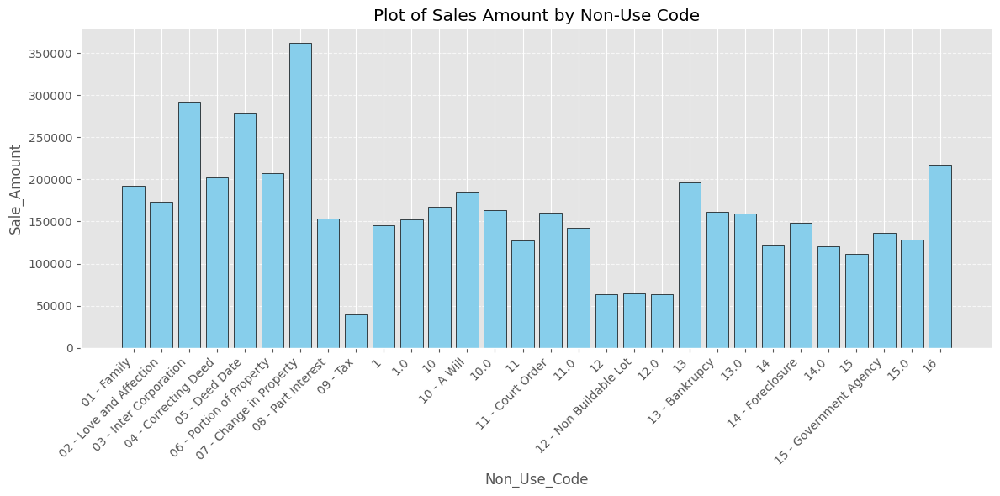

In [91]:
#plot for the Grouped Non_Use Code in respect to Sale Amount (#this is just a sample because the count for non_use_code is many so it will get clustered)
#bar chart to show clearer insights 
plt.figure(figsize=(12, 6))
plt.bar(Sample_Grouped_NUC.index, Sample_Grouped_NUC["Sale_Amount"], color='skyblue',edgecolor = 'black')

# Adding labels and title
plt.xlabel('Non_Use_Code')
plt.ylabel('Sale_Amount')
plt.title('Plot of Sales Amount by Non-Use Code')

# Display the plot
plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels by 45 degrees and align them to the right
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### ***Statistical Analysis***

In [92]:
Statistical_summary = Data_cleaned.groupby('Non_Use_Code')[['Assessed_Value', 'Sale_Amount']].agg(['mean', 'median', 'std'])

#view
Statistical_summary

Assessed_Value                           \
                                  mean    median            std   
Non_Use_Code                                                      
01 - Family              178524.820493  153790.0  102053.554568   
02 - Love and Affection  175043.809524  149100.0  106173.614588   
03 - Inter Corporation   231649.508099  191740.0  150145.415758   
04 - Correcting Deed     170829.647173  141480.0  122561.724406   
05 - Deed Date           208400.242424  164800.0  137476.934735   
...                                ...       ...            ...   
8.0                      160370.083219  110740.0  131276.705882   
88                        43400.000000   43400.0            NaN   
9                         41303.809524   37420.0   30754.709961   
9.0                       43512.000000   32565.0   50450.951968   
Single Family             99056.666667  132200.0   78081.999419   

                           Sale_Amount                           
                                  mean    median            std  
Non_Use_Code                                                     
01 - Family              191953.947961  160000.0  149754.426870  
02 - Love and Affection  173930.528139  152000.0  143779.211200  
03 - Inter Corporation   291713.631306  180000.0  255666.827443  
04 - Correcting Deed     202151.040936  157000.0  184538.735908  
05 - Deed Date           278398.866667  225000.0  218295.779232  
...                                ...       ...            ...  
8.0                      133531.569023   77000.0  158692.152042  
88                        70000.000000   70000.0            NaN  
9                         35366.809524   27600.0   29469.603544  
9.0                       50893.800000   12165.5  115736.717717  
Single Family            160666.666667  205000.0  117925.117483  

[106 rows x 6 columns]

In [93]:
assessment_stats = Data_cleaned.groupby('Non_Use_Code')[['Assessed_Value', 'Sale_Amount']].describe()
print("Descriptive Statistics of Assessed Values and Sale Amounts by Non-Use Code:\n")
print(assessment_stats)

Descriptive Statistics of Assessed Values and Sale Amounts by Non-Use Code:

                        Assessed_Value                                         \
                                 count           mean            std      min   
Non_Use_Code                                                                    
01 - Family                    13097.0  178524.820493  102053.554568      0.0   
02 - Love and Affection          231.0  175043.809524  106173.614588   2880.0   
03 - Inter Corporation          3025.0  231649.508099  150145.415758      0.0   
04 - Correcting Deed             513.0  170829.647173  122561.724406      0.0   
05 - Deed Date                   165.0  208400.242424  137476.934735   2660.0   
...                                ...            ...            ...      ...   
8.0                             5107.0  160370.083219  131276.705882      0.0   
88                                 1.0   43400.000000            NaN  43400.0   
9                               

In [94]:
#taking part of the dataset as a sample to have a clearer view.

Statistical_summary1 = Data_cleaned.groupby('Non_Use_Code')[['Assessed_Value', 'Sale_Amount']].agg(['mean', 'median', 'std'])[:20]

#view
Statistical_summary1

Assessed_Value                           \
                                   mean    median            std   
Non_Use_Code                                                       
01 - Family               178524.820493  153790.0  102053.554568   
02 - Love and Affection   175043.809524  149100.0  106173.614588   
03 - Inter Corporation    231649.508099  191740.0  150145.415758   
04 - Correcting Deed      170829.647173  141480.0  122561.724406   
05 - Deed Date            208400.242424  164800.0  137476.934735   
06 - Portion of Property  209886.624714  181545.0  152600.481505   
07 - Change in Property   163061.599217  127190.0  127393.559685   
08 - Part Interest        239386.021683  198020.0  144898.706878   
09 - Tax                   76509.988745   59390.0   69428.440885   
1                         114634.668750   96285.0   81490.485574   
1.0                       121388.518408   97630.0   88541.336713   
10                        102474.462929   83090.0   77561.039319   
10 - A Will               150464.022400  134700.0   88358.769286   
10.0                      103982.980245   78890.0   94602.552495   
11                         94650.053892   76230.0   77565.371567   
11 - Court Order          145496.091540  125161.0   87807.773832   
11.0                       93675.550162   76580.0   76804.556621   
12                         46713.319838   11760.0   78440.604672   
12 - Non Buildable Lot     56598.658688   10345.0   99891.496709   
12.0                       57552.280130   20790.0   92701.546641   

                            Sale_Amount                           
                                   mean    median            std  
Non_Use_Code                                                      
01 - Family               191953.947961  160000.0  149754.426870  
02 - Love and Affection   173930.528139  152000.0  143779.211200  
03 - Inter Corporation    291713.631306  180000.0  255666.827443  
04 - Correcting Deed      202151.040936  157000.0  184538.735908  
05 - Deed Date            278398.866667  225000.0  218295.779232  
06 - Portion of Property  207834.131138  126000.0  219180.078110  
07 - Change in Property   361621.880223  327000.0  192912.810598  
08 - Part Interest        153086.774879   90000.0  176340.278466  
09 - Tax                   40156.775134   21137.0   59477.953299  
1                         145841.926442  120000.0  129499.335444  
1.0                       152315.750867  128000.0  131522.577816  
10                        167132.213382  145000.0  138429.979443  
10 - A Will               185556.135064  160000.0  130748.686876  
10.0                      163205.193791  128900.0  149220.269252  
11                        127559.592814  102900.0  126657.100670  
11 - Court Order          160398.257587  130900.0  124819.107154  
11.0                      142397.537217  112000.0  141595.701307  
12                         63377.178138   15000.0  120943.115239  
12 - Non Buildable Lot     64374.226596   15000.0  130598.738109  
12.0                       63791.570033   16000.0  123974.588744

#### ***VISUALIZATION OF ASSESSMENT ACCURACY METRICS FOR DIFFERENT NON USE CODE***

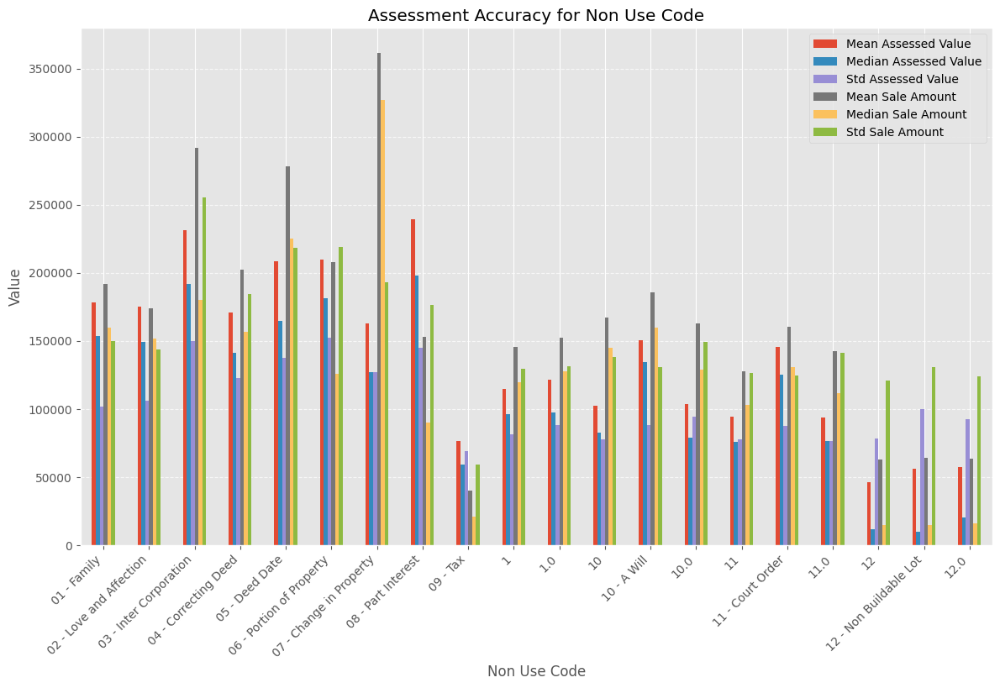

In [95]:
# Selecting specific property types and metrics
selected_metrics = Statistical_summary1.loc[:, [('Assessed_Value', 'mean'), ('Assessed_Value', 'median'),
                                            ('Assessed_Value', 'std'), ('Sale_Amount', 'mean'),
                                            ('Sale_Amount', 'median'), ('Sale_Amount', 'std')]]

# Plotting grouped bar plot
selected_metrics.plot(kind='bar', figsize=(14, 8))
plt.title('Assessment Accuracy for Non Use Code')
plt.xlabel('Non Use Code')
plt.ylabel('Value')
plt.xticks(rotation=45, ha='right')  # Rotate the x-axis labels by 45 degrees and align them to the right
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(['Mean Assessed Value', 'Median Assessed Value', 'Std Assessed Value', 'Mean Sale Amount', 'Median Sale Amount', 'Std Sale Amount'])


### ***INSIGHT GENERATED***


- Non-use codes highlight non-standard or atypical property transfers that may not follow traditional market dynamics. For example, transactions labeled with codes such as "Love and Affection" or "Correcting Deed" may involve unique circumstances that differ from typical market transactions.

- The nature of the transaction indicated by non-use codes can influence the assessed value of the property. For instance, transactions categorized as family transfers or love and affection may not reflect market value accurately and could result in assessed values that differ from typical market prices.

- Non-use codes provide insights into sales transactions beyond standard market transactions. They offer context regarding the relationship between the buyer and seller, the purpose of the transaction, or any legal considerations that may impact the property's value.

## ***OBJECTIVE SIX***

 -Assessor and OPM Remarks: Analyze remarks provided by assessors and the Office of Policy and Management (OPM) to identify factors influencing  assessment decisions and potential areas for improvement.


 - `OPM(Office of Policy and Management)`: It refers to comments, feedback, or instructions provided by the Office of Policy and Management regarding property assessments, policies, or related matters.

 - `Assessor remarks`: They are comments or notes provided by property assessors who are responsible for evaluating and determining the value of properties for taxation purposes. Assessor remarks provide context and additional information about the property being assessed.





###  ***Algorithm To achieve the above objective:***

-Text Preprocessing: Clean the text data by removing special characters, converting text to lowercase, and handling missing values..

-Tokenize the remarks to break them down into individual words and perform text analysis techniques such as sentiment analysis, keyword extraction, and topic modeling to extract insights from the remarks..

-Analyze assessors' and OPM remarks to identify common themes, keywords, or sentiments influencing assessment decisions related to properties..


In [96]:
#VALUE COUNT FOR OPM REMARK

print("Value Count for OPM Remrk: ", Data_cleaned["OPM_remarks"].value_counts())

Value Count for OPM Remrk:  OPM_remarks
GOOD SALE PER MLS                                                   988257
NO MLS                                                                 500
NEW CONSTRUCTION                                                       345
SHORT SALE PER MLS                                                     326
TOTAL RENOVATION PER MLS                                               316
                                                                     ...  
REMODELED PER MLS - SEE PREVIOUS SALE #170076                            1
REO SALE - CASH ONLY SOLD AS IS                                          1
TWO SALES - ALSO SEE #1700209                                            1
NOT A VALID SALE PER TOWN SITE AND PER MLS SALE PRICE = $345,000         1
PER MLS CLOSING PRICE = $1,145,000                                       1
Name: count, Length: 4825, dtype: int64


In [97]:
#unique value for OPM remarks
Data_cleaned["OPM_remarks"].unique()

array(['GOOD SALE PER MLS', 'GAS STATION',
       'RENOVATED ONE UNIT PER MLS - SEE PREVIOUS SALE #201127', ...,
       'INCLUDES #19158',
       'TOTAL RENOVATION PER MLS - SEE PREVIOUS SALE #1900075',
       'PER MLS CLOSING PRICE = $1,145,000'], dtype=object)

In [98]:
#VALUE COUNT FOR ASSESSOR REMARK

print("Value Count for Asssessor Remrk: ", Data_cleaned["Assessor_Remarks"].value_counts())

Value Count for Asssessor Remrk:  Assessor_Remarks
ESTATE SALE                                                               852393
BELOW MARKET                                                                2568
SHORT SALE                                                                  2510
NEW CONSTRUCTION                                                            2048
FORECLOSURE                                                                 1847
                                                                           ...  
estate sale;per verification house substan worse than as of assmt date         1
SOLD W/ GARAGE UNIT G-1                                                        1
sold less than market value                                                    1
no typical marketing/inconsistent value for area                               1
MOTIVATED SELLER -DIVORCE                                                      1
Name: count, Length: 66508, dtype: int64


In [99]:
#unique value for Assessor remarks
Data_cleaned["Assessor_Remarks"].unique()

array(['ESTATE SALE', 'WATERFRONT/COTTAGE ONLY/LAND IS ASSOCIATION OWNED',
       'FORECLOSURE SALE OUT OF BANK', ..., 'FAMILY & FARM LAND',
       'FORECLOSURE BY SALE:  1-7-9-0', 'MOTIVATED SELLER -DIVORCE'],
      dtype=object)

In [100]:
# Visualization
Corr = Data_cleaned.loc[:, ["Assessor_Remarks", "OPM_remarks", "Property_Type"]]

Corr

,Assessor_Remarks,OPM_remarks,Property_Type
0,ESTATE SALE,GOOD SALE PER MLS,Commercial
1,ESTATE SALE,GOOD SALE PER MLS,Residential
2,ESTATE SALE,GOOD SALE PER MLS,Residential
3,ESTATE SALE,GOOD SALE PER MLS,Residential
4,ESTATE SALE,GOOD SALE PER MLS,Residential
...,...,...,...
997208,ESTATE SALE,GOOD SALE PER MLS,Single Family
997209,PRIVATE SALE,GOOD SALE PER MLS,Single Family
997210,ESTATE SALE,GOOD SALE PER MLS,Single Family
997211,ESTATE SALE,GOOD SALE PER MLS,Single Family


In [101]:
grouped_remark = Data_cleaned.groupby(['Assessor_Remarks', 'OPM_remarks'])['Property_Type'].unique()

# Display the grouped data
print(grouped_remark)

Assessor_Remarks                                                           OPM_remarks      
"AS IS SALE"                                                               GOOD SALE PER MLS    [Single Family]
"AS IS" SALE                                                               GOOD SALE PER MLS            [Condo]
"AS IS" SALE - ALSO INCLUDES A LOT ACROSS THE STREET                       GOOD SALE PER MLS    [Single Family]
"AS IS" SUBJECT TO PROBATE                                                 GOOD SALE PER MLS    [Single Family]
"BROADCAST HOUSE"                                                          GOOD SALE PER MLS    [Single Family]
                                                                                                     ...       
work done on property prior to sale and after assmt date                   GOOD SALE PER MLS    [Single Family]
zone change to more intensive use afer assessment date                     GOOD SALE PER MLS    [Single Family]
zone chg to

### INSIGHT GENERATED

- The dataset includes various Assessor Remarks such as "AS IS SALE," "AS IS SUBJECT TO PROBATE," "BROADCAST HOUSE," "work done on property prior to sale and after assmt date," and more.

- The OPM Remarks in the dataset are described as "GOOD SALE PER MLS" for most of all entries

- OPM Remarks may signify that the property sale was considered good based on Multiple Listing Service (MLS) data. MLS means `Multiple Listing System ` which plays a crucial role in the real estate industry by facilitating collaboration among real estate professionals, providing access to comprehensive property listings, and serving as a valuable tool for marketing and promoting properties for sale or rent.

- Each unique Assessor Remark likely signifies specific factors or events that influence the assessment process, such as property condition, legal considerations, or transaction details.

### ***TEXT PREPROCESSING***

In [102]:
#for Text Preprocessing
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords

In [103]:
# Preprocess assessors' remarks
assessors_remarks = Data_cleaned['Assessor_Remarks'].dropna().str.lower()  # Convert to lowercase
assessors_remarks = assessors_remarks.apply(word_tokenize)  # Tokenization

In [104]:
# Preprocess OPM remarks
opm_remarks = Data_cleaned['OPM_remarks'].dropna().str.lower()  # Convert to lowercase
opm_remarks = opm_remarks.apply(word_tokenize)  # Tokenization

In [105]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [106]:
# Remove stopwords
stop_words = set(stopwords.words('english'))
assessors_remarks = assessors_remarks.apply(lambda x: [word for word in x if word.lower() not in stop_words])
opm_remarks = opm_remarks.apply(lambda x: [word for word in x if word.lower() not in stop_words])

### ***VISUALIZATION***

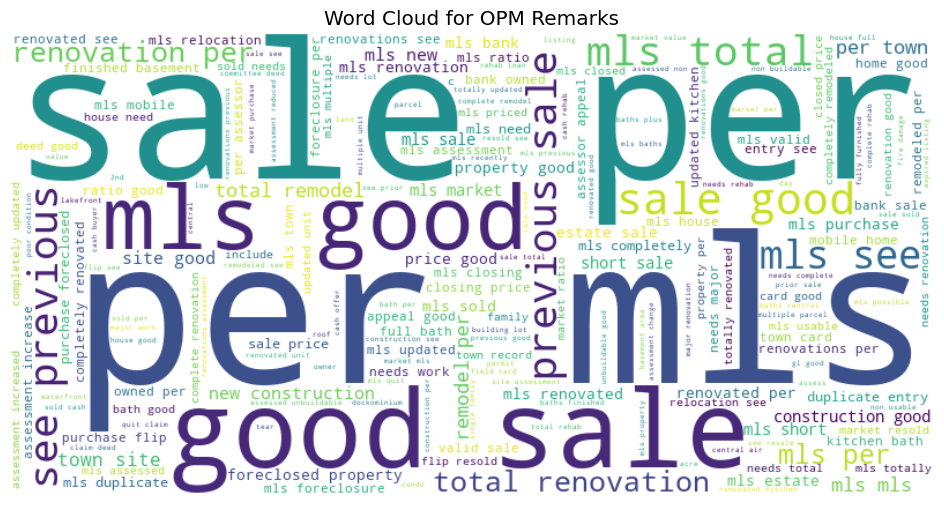

In [107]:
from wordcloud import WordCloud


# Combine OPM remarks for word cloud visualization
opm_combined_remarks = ' '.join([' '.join(remark) for remark in opm_remarks])

# Generate a word cloud for OPM remarks
wordcloud_opm = WordCloud(width=800, height=400, background_color='white').generate(opm_combined_remarks)

# Display the word cloud for OPM remarks
plt.figure(figsize=(14, 6))
plt.imshow(wordcloud_opm, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for OPM Remarks')
plt.show()

***The image is a word cloud generated from remarks related to the Office of Personnel Management (OPM).These words indicate OPM remarks discussing properties for sale, their features, and considerations for buyers or sellers.***

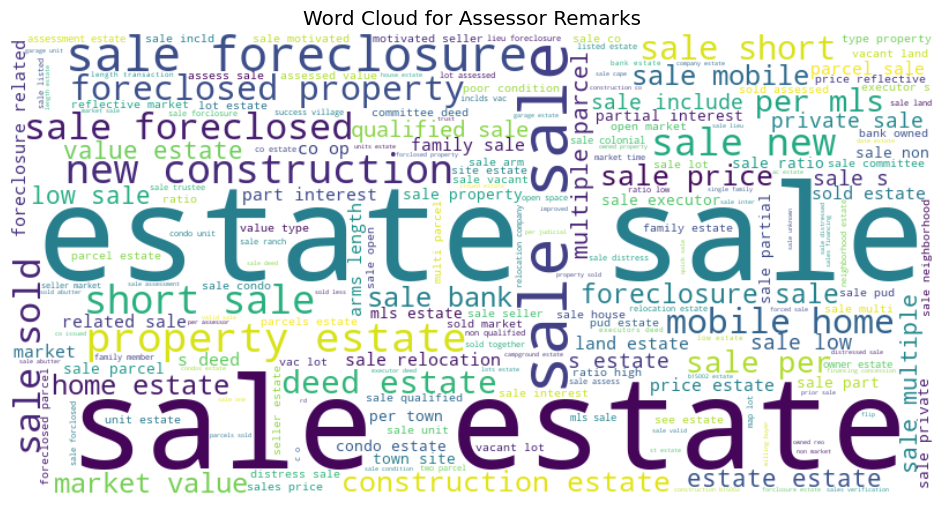

In [108]:
# Combine OPM remarks for word cloud visualization
assessor_combined_remarks = ' '.join([' '.join(remark) for remark in assessors_remarks])

# Generate a word cloud for OPM remarks
wordcloud_assessor = WordCloud(width=800, height=400, background_color='white').generate(assessor_combined_remarks)

# Display the word cloud for Assessor remarks
plt.figure(figsize=(14, 6))
plt.imshow(wordcloud_assessor, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Assessor Remarks')
plt.show()

***The image above indicates that the Assessor Remarks cover a wide range of property types, sales conditions, and terms related to real estate transactions. Terms like "distress sale," "foreclosure," and "market value" suggest discussions about different sales scenarios and property conditions. The presence of phrases like "condo unit," "vacant land," and "colonial sale" indicates the diversity of properties being assessed or sold.***

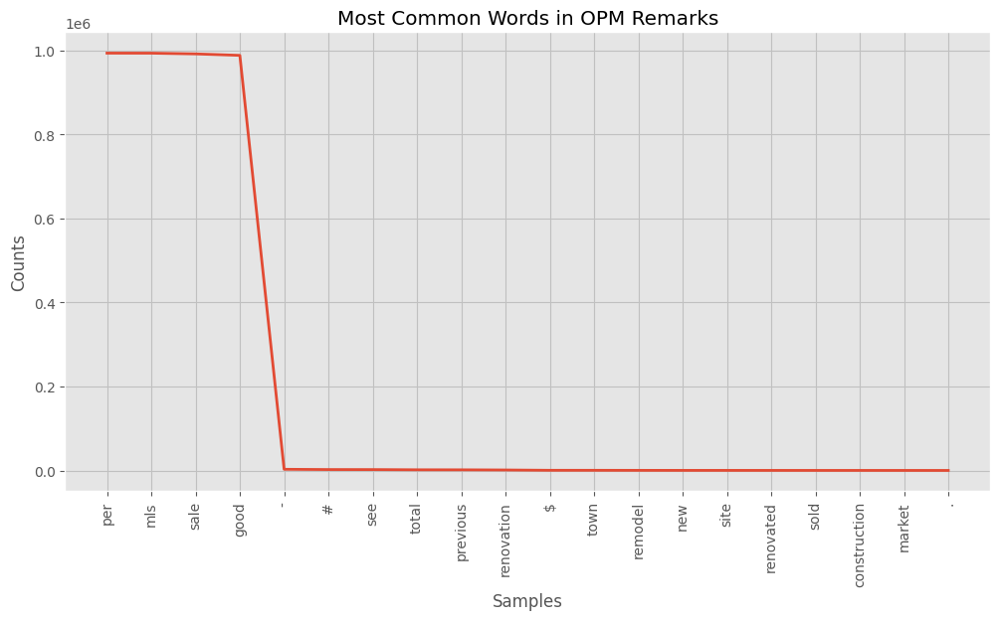

In [109]:
#Visualize the most common words in OPM remarks
from nltk import FreqDist

all_words_opm = [word for sublist in opm_remarks for word in sublist]
word_freq_opm = FreqDist(all_words_opm)

# Plot the most common words in OPM remarks
plt.figure(figsize=(12, 6))
plt.title('Most Common Words in OPM Remarks')
word_freq_opm.plot(20);



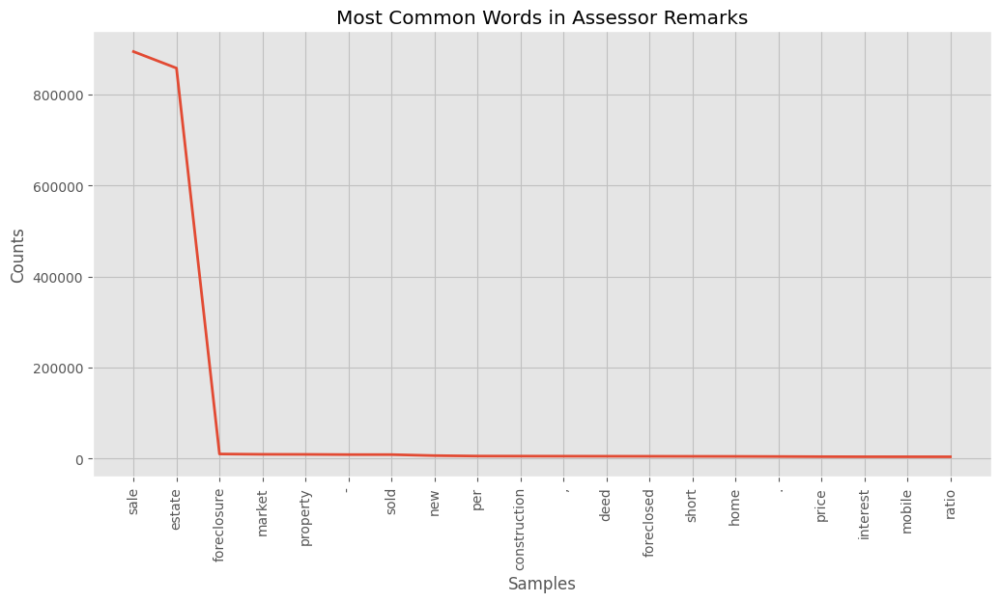

In [110]:
# Visualize the most common words in Assessor remarks
all_words_assessor = [word for sublist in assessors_remarks for word in sublist]
word_freq_assessor = FreqDist(all_words_assessor)

# Plot the most common words in OPM remarks
plt.figure(figsize=(12, 6))
plt.title('Most Common Words in Assessor Remarks')
word_freq_assessor.plot(20);

## ***RECOMMENDATION***

`THESE RECOMMENDATION IS BASED ON THE INSIGHT GENERATED AFTER PERFORMING EXPLORATORY DATA ANALYSIS TASK ON THE REAL ESTATE SALES DATASET`

#### ***BASED ON FIRST OBJECTIVE (ASSESSMENT ACCURACY)***

- Improve the accuracy of property assessments and ensure consistency between assessed values and actual sale amounts.

- Identify root cause: Investigate the cases where the discrepancy between assessed value and sale amount is significant (e.g., cases where the discrepancy exceeds the 75th percentile value of $158,900). Determine the underlying reasons for these discrepancies, such as errors in assessment, market fluctuations, and property conditions.

- Quality Assurance: Implement measures to improve the accuracy and reliability of property assessments. This may include enhancing assessment procedures, providing additional training to assessors, and conducting regular audits to identify and rectify discrepancies.

- Establish a system for continuous monitoring and evaluation of assessment practices and discrepancies over time. Regularly review and analyze discrepancies to identify trends, patterns, and areas for improvement in the assessment process.

- Transparency and Communication: Foster collaboration between assessors, property owners, real estate professionals, and other stakeholders to exchange feedback and insights regarding assessment discrepancies

`By reviewing these recommendations, stakeholders can enhance the accuracy and reliability of property assessments, reduce discrepancies between assessed values and sale amounts, and ultimately improve trust and confidence in the assessment process among all stakeholders involved`



#### ***BASED ON SECOND OBJECTIVE (MARKET TRENDS)***
- Stay informed about market trends and dynamics by engaging with local assessors, real estate professionals, and industry experts.

- Advocate for fairness in property assessments to ensure equitable taxation, access to housing, and fair treatment of property owners.

- Based on property types, `Condos`, in particular, exhibit a lower sales ratio compared to other residential types, indicating that sale amounts for Condos are generally lower in proportion to their assessed values. This trend suggests potential market conditions such as lower demand or a buyer's market specific to Condos. It is recommended to:

  1. Conduct a comprehensive analysis of the Condo market segment to understand the underlying factors contributing to the lower sales ratio.
 
  2. Based on the market analysis, stakeholders should evaluate and adjust pricing strategies for Condos to align with market demand and improve sales performance. This may involve revisiting assessed values, offering competitive pricing, and implementing effective marketing strategies to attract potential buyers.
 
  3. Continuously monitor market trends, sales data, and feedback from potential buyers to adapt strategies in real-time. Stay informed about changes in market conditions, buyer preferences, and competitive landscape to make informed decisions and remain agile in responding to market dynamics.
 
  4. Foster collaboration and networking within the real estate community to share insights, best practices, and market intelligence related to Condo properties.

- Based on `Residential Type`:
  1. Focus on maintaining competitive pricing strategies to capitalize on steady demand and explore investment opportunities in Multi-Family properties for rental income and long-term appreciation.
 
  2. Consider negotiating favorable deals and value-added strategies like redevelopment to maximize returns.
 
  3. For Vacant Land, evaluate the potential for land development with thorough due diligence and feasibility studies.
 
  4. Stakeholders should leverage market insights to tailor strategies, identify opportunities, and address challenges specific to each property category.
 



#### ***BASED ON THIRD OBJECTIVE (GEOGRAPHICAL ANALYSIS)***

- Conduct detailed market analysis in towns with lower average assessed values but higher sale amounts to understand the dynamics driving sales in those areas. There may be opportunities for growth or development.

- Consider investing in real estate in towns like New Canaan, Darien, Greenwich, and Weston due to their higher average assessed values. These towns may offer good investment potential.

- Diversify your real estate portfolio by investing in a mix of towns with varying assessed values and sale amounts. This can help spread risk and maximize return.

- Conduct a thorough review of property valuation methods and practices in areas with low market ratios to ensure accuracy and fairness in assessments.

- Explore community development initiatives or incentives to stimulate property demand and address market imbalances in areas with consistently low market ratios.

- Conduct market analysis and outreach efforts in areas with low market ratios to understand factors influencing property values and to address any issues affecting market dynamics.





#### ***BASED ON FOURTH OBJECTIVE (PROPERTY TYPE IMPACT)***

- Stakeholders should collaborate with real estate experts and appraisers to identify and implement property type-specific valuation methodologies. This may involve considering factors such as location, size, condition, and use case of the property to ensure accurate assessments.

- Stakeholders should leverage data analytics and market intelligence tools to analyze sales trends, pricing dynamics, and demand-supply factors for various property types. This information can inform valuation decisions and help stakeholders understand how each property type is performing in the market.

- Implement regular reviews of property valuations based on updated market data and performance metrics.

- Collaborate with local authorities and regulatory bodies to establish guidelines and standards for property valuation practices and ensure compliance with regulations to maintain transparency and fairness in property assessments.




#### ***BASED ON FIFTH OBJECTIVE (NON USE CODE)***

-  Ensure thorough documentation and recording of non-use codes associated with property transactions. This includes accurately capturing the nature of the transaction, its purpose, and any relevant details that could impact the property's assessed value.

-  Implement regular reviews and validations of property assessments involving non-use codes to ensure consistency and accuracy.



#### ***BASED ON SIXTH OBJECTIVE (ASSESSOR AND OPM REMARKS)***

- Recommend enhancing data collection processes to capture more detailed and standardized Assessor Remarks to improve the accuracy and depth of property assessments.

- Recommend implementing a feedback mechanism to gather input from assessors and stakeholders on the effectiveness of utilizing Assessor Remarks in property assessments, enabling continuous improvement.

- Suggest optimizing the property assessment process by leveraging insights from the analysis to streamline assessments, identify key factors influencing valuations, and improve decision-making.
